# **7. Training Neural Networks | Deep Learning**
---

## 7.1 Activation Functions

Activation functions are critical components in neural networks, enabling them to learn complex patterns. They introduce non-linearity into the network, allowing the model to approximate any function and make more sophisticated decisions. Here's an overview of the most commonly used activation functions in neural networks:

### 1. **What is an Activation Function?**
   - An **activation function** is a mathematical function that takes an input and produces an output based on the input. It determines whether a neuron should be activated or not by applying a transformation.
   - Without activation functions, neural networks would essentially be just linear transformations, limiting their ability to learn complex patterns.

### 2. **Types of Activation Functions**
   
#### 2.1 **Sigmoid**
   - **Formula:** 
     ```plaintext
     f(x) = 1 / (1 + e^(-x))
     ```
![](https://machinelearningmastery.com/wp-content/uploads/2021/08/sigmoidUnit-768x307.png)

![](https://machinelearningmastery.com/wp-content/uploads/2021/08/sigmoid-768x430.png)

   - **Range:** (0, 1)
   - **Usage:** Commonly used in binary classification problems as it maps any input to a value between 0 and 1, making it suitable for probability estimation.
   - **Advantages:** Simple, interpretable output (probability).
   - **Disadvantages:**

      1. **Vanishing Gradient Problem**
         - **Issue:** Sigmoid saturates for large positive or negative inputs, causing the gradient to become very small.
         - **Impact:** Slows down training due to small gradients, especially in deep networks.
![](https://machinelearningmastery.com/wp-content/uploads/2021/08/sigmoid-768x430.png)
      2. **Output Not Zero-Centered**
         - **Issue:** Sigmoid outputs always fall between 0 and 1, making gradients biased and causing slow convergence.
         - **Impact:** Can lead to inefficient weight updates.
         - For sigmoid activation functions, **zero-mean input** is beneficial because it:
            1. **Improves Gradient Flow**: Ensures the gradients are larger and more effective during backpropagation, allowing for better weight updates.
            2. **Avoids Saturation**: Keeps the inputs in the active region of the sigmoid curve, preventing the gradients from becoming too small and causing slow learning.
            3. **Speeds Up Convergence**: Helps the network converge faster by avoiding regions of the sigmoid where the gradient is near zero.
            4. **Balances Output Distribution**: Keeps the activations centered around the middle of the sigmoid function, preventing neurons from becoming too active or inactive.

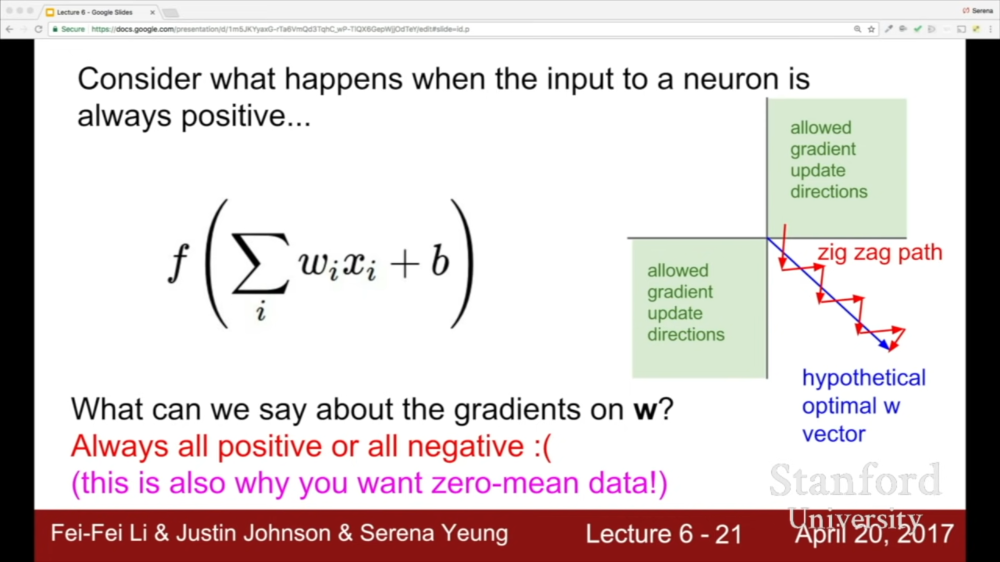
      3. **Computationally Expensive**
         - **Issue:** Sigmoid requires calculating an exponential function (\(e^{-x}\)), which is slower than simpler operations like ReLU.
         - **Impact:** Increases computational cost, especially in large networks.

   - **Alternatives:** 
      - **ReLU**: Solves vanishing gradient and computational cost issues.
      - **Tanh**: Zero-centered alternative to Sigmoid.   

#### 2.2 **Hyperbolic Tangent (tanh)**
   - **Formula:**
     ```plaintext
     f(x) = (e^x - e^(-x)) / (e^x + e^(-x))
     ```

![](https://miro.medium.com/v2/resize:fit:828/format:webp/1*f9erByySVjTjohfFdNkJYQ.jpeg)

   - **Range:** (-1, 1)
   - **Usage:** Often used in hidden layers as it centers the output around zero, helping reduce bias in the network.
   - **Advantages:** Unlike sigmoid, it has a wider output range, making it more effective in hidden layers.
   - **Disadvantages:** Still suffers from the vanishing gradient problem for extreme values of input.

      - **Range**: The tanh function squashes input values to the range **[-1, 1]**.
      - **Zero-Centered**: Unlike the sigmoid, tanh is zero-centered, meaning that its output can be both negative and positive, which helps reduce bias in the network.
      - **Vanishing Gradient Problem**: Despite being zero-centered, tanh still suffers from the **vanishing gradient problem** when the input values are very large or very small. In these cases, the gradient becomes very small, leading to slow or stalled learning.


#### 2.3 **ReLU (Rectified Linear Unit)**
   - **Formula:** 
     ```plaintext
     f(x) = max(0, x)
     ```
![](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*XxxiA0jJvPrHEJHD4z893g.png)

   - **Range:** (0, ∞)
   - **Usage:** Frequently used in hidden layers of deep neural networks, especially in CNNs and deep learning models.
   - **Advantages:** Computationally efficient and helps alleviate the vanishing gradient problem by allowing gradients to pass through unimpeded for positive values.
   - **Disadvantages:** Can cause "dead neurons," where neurons stop learning if the input is always negative.

      - **Range**: The output range is **[0, ∞)**.
      - **Simplicity and Efficiency**: ReLU is computationally efficient and introduces non-linearity while being simple to implement.
      - **Does Not Saturate in Positive Region**: Unlike sigmoid and tanh, ReLU does not saturate for positive input values, which helps prevent the vanishing gradient problem and allows for faster training.
      - **Very Computationally Efficient**: ReLU is more efficient compared to other activation functions like sigmoid and tanh, making it faster to train models.
      - **Converges Faster**: In practice, models using ReLU can converge **6x faster** than those using sigmoid or tanh due to its efficiency and lack of saturation in the positive region.
      - **Biologically Plausible**: ReLU is often considered more biologically plausible because it mimics the way neurons activate in response to stimuli.
      - **Not Zero-Centered**: Like the sigmoid function, ReLU is **not zero-centered**, which can sometimes cause issues during optimization, especially in deep networks.
      - **"Dead Neurons" Problem**: One downside is that ReLU can lead to "dead neurons," where some neurons stop updating their weights during training if the input is always negative, causing them to remain inactive.
         - initializing the neurons of a ReLU activation function with slightly positive biases is a common practice to avoid the "dead neuron" problem

```python
# Example in TensorFlow/Keras:
model.add(Dense(units=128, activation='relu', bias_initializer='zeros'))  # Default is zero bias

# To initialize with a small positive bias:
model.add(Dense(units=128, activation='relu', bias_initializer=initializers.Constant(0.01)))

```
#### 2.4 **Leaky ReLU**
   - **Formula:** 
     ```plaintext
     f(x) = max(α * x, x)
     ```
     where \( α \) is a small constant.

![](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*A_Bzn0CjUgOXtPCJKnKLqA.jpeg)

   - **Range:** (-∞, ∞)
   - **Usage:** A variation of ReLU to address the "dying ReLU" problem by allowing a small gradient when the input is negative.
   - **Advantages:** Prevents neurons from dying during training.
   - **Disadvantages:** Requires tuning of the parameter \( α \), and the output range remains unbounded.

      - **Range**: The output range is **(-∞, ∞)**, unlike ReLU, which has a range of **[0, ∞)**.
      - **Prevents "Dead Neurons"**: Unlike ReLU, which sets negative inputs to zero, **Leaky ReLU** allows a small, non-zero slope (typically defined by a small constant \(\alpha\)) for negative inputs. This means neurons can still contribute to learning even when the input is negative, preventing the "dead neuron" issue.
      - **Computational Efficiency**: Like ReLU, Leaky ReLU is computationally efficient and still provides non-linearity, making it easy to implement and train on large datasets.
      - **Converges Faster**: Similar to ReLU, Leaky ReLU allows for faster training and helps the model converge more quickly than sigmoid or tanh because it avoids saturation for both positive and negative inputs.
      - **Avoids Vanishing Gradient Problem**: Since Leaky ReLU maintains a small slope for negative inputs, it prevents neurons from becoming inactive during training, addressing the vanishing gradient problem to a degree.
      - **Simplicity and Biologically Plausible**: Leaky ReLU retains the simplicity of ReLU and is still biologically plausible, as it mimics more complex neural behaviors.
      - **Not Zero-Centered**: Like ReLU, Leaky ReLU is not zero-centered, which can sometimes introduce biases during training, especially in deep networks. This can be mitigated with proper weight initialization.
      - **Bias Initialization**: To further improve the performance of Leaky ReLU, initializing the biases with a small positive value can be useful, especially for ensuring that more neurons activate at the start of training.
      

```python
f(x) = max(αx, x)
```

#### 2.5 **Softmax**
   - **Formula:** 
     ```plaintext
     f(x_i) = e^(x_i) / sum(e^(x_j))
     ```
     where \(x_i\) is the input for the \(i^{th}\) class and \(n\) is the total number of classes.
   - **Range:** (0, 1), the sum of all outputs equals 1.
   - **Usage:** Typically used in the output layer of a multi-class classification model. It transforms the raw output scores (logits) into probabilities.
   - **Advantages:** Converts network outputs into a probability distribution over classes.
   - **Disadvantages:** Computationally expensive when there are many classes.


![](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*p_hyqAtyI8pbt2kEl6siOQ.png)
![](https://miro.medium.com/v2/resize:fit:1100/format:webp/1*n1HFBpwv21FCAzGjmWt1sg.png)

### 3. **Choosing the Right Activation Function**
   - **For Hidden Layers:**
     - **ReLU** is usually the default choice due to its simplicity, faster training, and ability to combat the vanishing gradient problem.
     - **Leaky ReLU** can be considered if you're facing issues with dead neurons.
     - **Tanh** may be useful if the network requires output to be centered around zero.
   - **For Output Layer:**
     - **Sigmoid** is best for binary classification tasks.
     - **Softmax** is ideal for multi-class classification problems.

### 4. **Challenges with Activation Functions**
   - **Vanishing Gradient Problem:** Activation functions like sigmoid and tanh suffer from this issue when inputs are too large or too small, leading to slow or stagnated training.
   - **Dying ReLU Problem:** ReLU can cause some neurons to "die," meaning they stop updating their weights during training.
   - **Exploding Gradients:** This occurs when large gradients cause extreme weight updates, destabilizing the training process. Techniques like gradient clipping can help mitigate this.

### **Activation Function Comparison: Sigmoid, ReLU, Leaky ReLU, Softmax, Tanh, and PReLU**

| Feature                     | **Sigmoid**                                | **ReLU**                                       | **Leaky ReLU**                                  | **Softmax**                                  | **Tanh**                                    | **PReLU**                                      |
|-----------------------------|--------------------------------------------|------------------------------------------------|-------------------------------------------------|---------------------------------------------|---------------------------------------------|------------------------------------------------|
| **Range**                   | (0, 1)                                     | [0, ∞)                                         | (-∞, ∞)                                         | (0, 1), outputs sum to 1                    | (-1, 1)                                     | (-∞, ∞)                                       |
| **Zero-Centered?**           | Yes                                        | No                                             | No                                              | Yes, for each class output                  | Yes                                        | Yes                                            |
| **Saturation Issue?**        | Yes, saturates for very large or small inputs | No saturation in the positive region           | No saturation in both positive and negative regions | No saturation, normalizes outputs           | Yes, saturates for very large or small inputs | No saturation, learns slope for negatives      |
| **Vanishing Gradient Issue?**| Yes, especially for extreme values         | No, for positive values                        | Less severe than ReLU for negative values       | No vanishing gradient problem                | Yes, especially for extreme values          | No, mitigates dying neurons                   |
| **Computational Efficiency** | Low, due to exponential calculations       | High, simple and efficient                     | High, but slightly less efficient than ReLU     | High, requires exponentiation and normalization | Medium, requires exponentiation              | High, similar to ReLU, but with learnable parameters |
| **Convergence Speed**        | Slower due to vanishing gradients          | Faster than sigmoid and tanh                   | Similar to ReLU, faster than sigmoid and tanh   | Slower, due to normalization over all outputs | Slower, due to saturation                    | Similar to ReLU, potentially faster with learned slopes |
| **Biological Plausibility**  | Less plausible                            | More plausible than sigmoid                    | More plausible than sigmoid, similar to ReLU    | Not as biologically plausible                | More plausible than sigmoid                  | More plausible, as it adapts slopes            |
| **Dying Neurons**            | No issues with dying neurons               | Yes, "dead neurons" for negative inputs        | No, due to small slope for negative inputs      | No, since outputs are normalized to [0, 1]   | No, but can suffer from vanishing gradients   | No, due to learnable parameters for negative inputs |
| **Use Case**                 | Binary classification, probability modeling| Hidden layers, deep networks                   | Hidden layers, avoiding dead neurons            | Multi-class classification, converts logits to probabilities | Hidden layers, normalized data              | Hidden layers, avoiding dead neurons           |
| **Common Practice**          | Bias initialization not as critical        | Bias initialization with slightly positive values | Bias initialization with slightly positive values | Output layer in multi-class classification    | Hidden layers, normalized data               | Bias initialization with slightly positive values |
| **Formula**                  | 1 / (1 + e^(-x))                           | max(0, x)                                      | max(αx, x), where α is a small constant         | f(x_i) = e^(x_i) / Σ e^(x_j)                | (e^x - e^(-x)) / (e^x + e^(-x))              | f(x) = max(αx, x), where α is learned during training |
| **Best Use**                 | Best used in the output layer for binary classification tasks where probabilities are needed | Best used for hidden layers in deep networks, especially for tasks like image classification | Best used in hidden layers where we want to avoid the "dead neuron" problem, especially for networks with sparse activations | Best used in the output layer for multi-class classification tasks, especially in models like neural networks for image classification | Best used in hidden layers for tasks that benefit from normalized outputs and are prone to vanishing gradients | Best used in hidden layers, similar to ReLU, but with learnable parameters to avoid dead neurons and allow flexibility |



### 6. **Conclusion**
   - Activation functions are the foundation of neural network learning, enabling the network to model complex relationships. Each function has its strengths and weaknesses, and choosing the appropriate one for each layer and task is key to building an efficient and effective neural network.

---
## 7.2 Preprocessing Data  

Preprocessing data for neural networks, specifically for Convolutional Neural Networks (CNNs), is a crucial step to improve the model's performance and training efficiency. Here's a structured overview of preprocessing techniques for CNN applications:

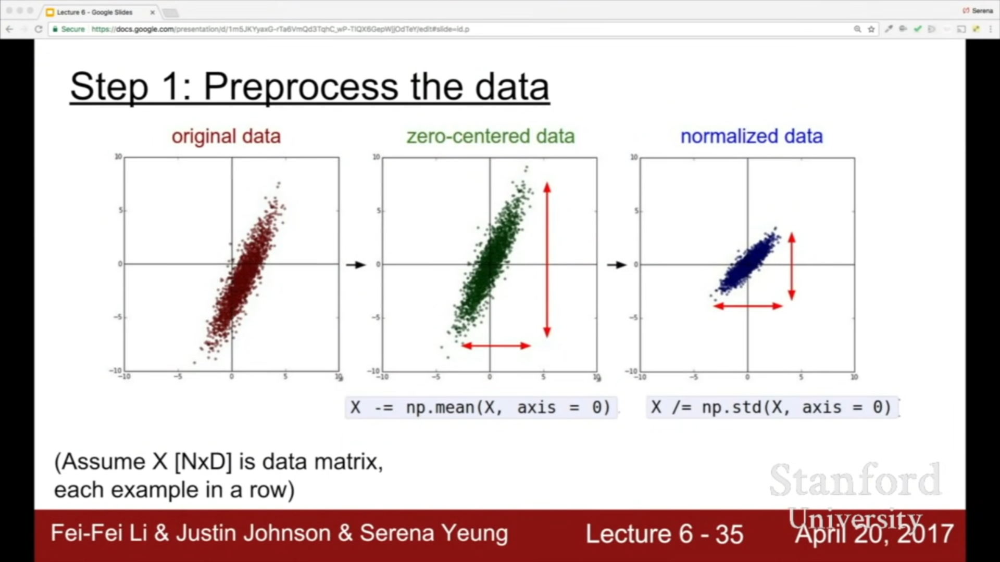


1. **Data Normalization/Scaling**  
   **Purpose**: Normalize or scale the pixel values to a standard range (usually 0 to 1 or -1 to 1) to help the model converge faster during training.  
   **Common Techniques**:  
   - **Min-Max Scaling**:  
     Scale the pixel values to the range [0, 1].  
     Formula:
     ```python
     X_scaled = (X - X.min()) / (X.max() - X.min())
     ```
   - **Z-Score Standardization (Normalization)**:  
     Scale the data to have a mean of 0 and a standard deviation of 1.  
     Formula:
     ```python
     X_normalized = (X - mean) / std
     ```
   **Why**: CNNs usually perform better when the input data is normalized, as it ensures all features contribute equally and avoids bias toward features with larger ranges.

2. **Data Augmentation**  
   **Purpose**: Artificially expand the dataset by applying random transformations to the input images. This helps the model generalize better and avoid overfitting.  
   **Common Techniques**:  
   - **Rotation**: Randomly rotate images within a specified angle range (e.g., -30 to 30 degrees).  
   - **Width/Height Shift**: Randomly shift the image horizontally or vertically.  
   - **Zoom**: Randomly zoom in on the image.  
   - **Flip**: Horizontally flip the image (for tasks like image classification where orientation doesn't matter).  
   - **Color Jittering**: Randomly adjust the brightness, contrast, or saturation.  
   - **Shear**: Apply shear transformations to simulate perspective distortions.  
   **Why**: Data augmentation helps CNNs become more invariant to common transformations, like translations or rotations, and improves generalization.

3. **Image Resizing**  
   **Purpose**: Standardize the input image size so that it fits the CNN input layer.  
   **Common Techniques**:  
   Resize all images to the same dimensions (e.g., 224x224, 256x256, or 512x512).  
   **Why**: CNNs expect inputs of consistent size, so resizing images ensures compatibility with the network architecture. It also helps reduce computational costs when processing images.

4. **Centering/Cropping**  
   **Purpose**: Focus the network on the main object of the image.  
   **Common Techniques**:  
   - **Center Cropping**: Crop the center of the image to focus on the relevant part of the image.  
   - **Random Cropping**: Randomly crop a part of the image (e.g., 224x224 from a 256x256 image) to introduce variability during training.  
   **Why**: Cropping can focus the network on the most important features of the image, which is useful for object detection and classification.

5. **Grayscale Conversion (Optional)**  
   **Purpose**: Convert color images to grayscale if color is not essential for the task.  
   **Why**: For simpler tasks, removing color information can reduce the computational cost and focus on spatial patterns, though it's not typically used in image classification tasks where color is important.

6. **Channel-wise Normalization**  
   **Purpose**: Normalize each color channel separately.  
   **Common Techniques**:  
   For RGB Images: Subtract the mean and divide by the standard deviation for each channel (Red, Green, Blue).  
   Example using mean and standard deviation (for pre-trained models):  
   ```python
   mean = [0.485, 0.456, 0.406]  # Example mean values for ImageNet  
   std = [0.229, 0.224, 0.225]   # Example standard deviation values for ImageNet  
   X_normalized = (X - mean) / std
   ```
   **Why**: Channel-wise normalization helps maintain consistency across color channels and provides a better input for pre-trained networks, which expect inputs to be normalized in a particular way.

7. **Data Shuffling**
   **Purpose**: Shuffle the dataset before training to ensure that the model doesn’t learn based on the order of the data.
   **Why**: Shuffling helps ensure that the model generalizes well by preventing the network from memorizing patterns based on the data order.

8. **Handling Missing Data (if applicable)**
   **Purpose**: If images have missing data (e.g., corrupted files or incomplete), handle them appropriately.
   **Common Techniques**:
   - **Remove corrupted images**: Discard images that can't be loaded or processed.
   - **Imputation**: In cases where pixels are missing, consider filling them with the average color or using techniques like inpainting.
   **Why**: Missing data can cause training issues and affect the model’s ability to generalize, so addressing this beforehand is crucial.

9. **Label Encoding (For Multi-Class Classification)**
   **Purpose**: Convert categorical labels to numerical format.
   **Common Techniques**:
   - **One-hot Encoding**: Create a binary vector for each class. For example, for 3 classes, class 1 would be `[1, 0, 0]`, class 2 would be `[0, 1, 0]`, and class 3 would be `[0, 0, 1]`.
   - **Integer Encoding**: Assign a unique integer to each class (e.g., class 1 → 0, class 2 → 1).
   **Why**: CNNs typically work with numerical data, so converting class labels to numeric format is necessary.

10. **Batch Normalization (Optional)**
   **Purpose**: Normalize activations within a batch during training to improve model convergence.
   **Why**: Batch normalization helps to stabilize training by reducing internal covariate shift and improving gradient flow.

11. **Data Splitting**
   **Purpose**: Split data into training, validation, and test sets.
   **Common Techniques**:
   - **80-20 or 70-30 Split**: Use 80% or 70% of the data for training and the remaining 20% or 30% for validation and testing.
   - **Cross-validation**: Use K-fold cross-validation to ensure that the model performs well across multiple subsets of the data.
   **Why**: Proper data splitting ensures that the model is evaluated on unseen data, which helps estimate its real-world performance.
   

```python
import numpy as np
import cv2
from keras.preprocessing.image import ImageDataGenerator

# Example: Load and preprocess image
image = cv2.imread('image.jpg')

# Resize image
image_resized = cv2.resize(image, (224, 224))

# Normalize image
image_normalized = image_resized / 255.0

# Data Augmentation using ImageDataGenerator
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Reshape image for augmentation (adding batch dimension)
image_expanded = np.expand_dims(image_normalized, axis=0)

# Augment and show the image
for augmented_image in datagen.flow(image_expanded, batch_size=1):
    cv2.imshow('Augmented Image', augmented_image[0])
    break


```
> In summary, zero-centering data around the mean can improve neural network training by standardizing inputs, but it affects different activation functions uniquely: 
- **ReLU**: Zero-centered data can lead to inactive "dead" neurons, especially in deep layers. Using **Leaky ReLU** or **PReLU** can mitigate this by allowing small gradients for negative values.
- **Sigmoid**: Centering can push inputs into the sigmoid’s saturation region, causing vanishing gradients and slowing learning. **Tanh** is often a better choice in hidden layers as it's zero-centered and supports smoother gradient flow.
- **Batch Normalization**: Applying batch normalization stabilizes training across layers by dynamically re-centering and scaling activations, reducing issues from poor gradient flow in deep networks.

Ultimately, combining zero-centered data with appropriate activation functions and batch normalization can lead to faster, more stable training in neural networks.



---

## 7.3 Weight Initialization in the Context of CNNs

In Convolutional Neural Networks (CNNs), weight initialization is critical for training stability and performance. CNNs consist of multiple layers, each with filters (kernels) that learn spatial hierarchies of features, from edges in lower layers to more complex patterns in deeper layers. Proper weight initialization in CNNs ensures that each filter learns distinct features and avoids issues like slow convergence or vanishing/exploding gradients.

Due to the depth and structure of CNNs, initialization strategies that take into account the number of connections in each layer, such as Xavier or He initialization, are commonly used. These strategies help maintain gradient flow throughout the network, preventing gradients from diminishing or exploding as they pass through multiple layers. By doing so, they allow each layer to learn unique and meaningful representations, improving the overall model performance.

### Q: What Happens When `W=0` Initialization is Used?

When weights are initialized to zero (`W=0`), each neuron in the network produces identical outputs because all neurons start with the same weights and biases. This leads to a phenomenon known as **symmetry breaking failure**: if all neurons in a layer have the same weights, they compute the same gradients, update in the same direction, and learn identical features. Consequently, the model fails to learn diverse, meaningful patterns, severely limiting the network's capacity.

This effect is particularly problematic in CNNs, where distinct filters in convolutional layers are meant to capture different patterns and features. Without unique initial weights, the network's filters remain identical, significantly reducing the model's effectiveness and expressive power.

#### First Solution: Small Random Numbers

To avoid symmetry breaking failure, weights are often initialized with small random numbers. For example, using a **Gaussian distribution** with a mean of zero and a standard deviation of `1e-2` ensures that weights are close to zero but different for each neuron. This small variation breaks symmetry, allowing each neuron and filter to learn distinct features and improving the diversity of learned patterns in CNNs.

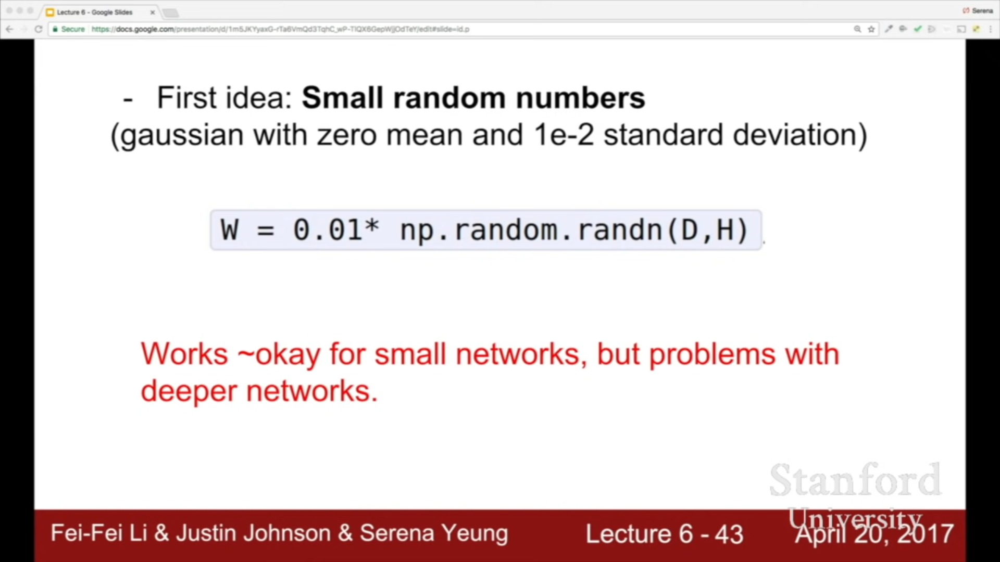

#### Practical Solutions:
In practice, more advanced initializations like **Xavier initialization** (for tanh activation functions) or **He initialization** (for ReLU-based networks) are preferred in deep CNNs. These methods take the size of the layer into account, leading to faster convergence and improved stability, especially in deeper networks.


### Q: What Happens When `W=very large` Initialization is Used?

When weights are initialized with very large values, several issues can arise in training a Convolutional Neural Network (CNN), leading to poor performance and training instability.

1. **Exploding Activations**:
   With large weights, the activations at each layer can become excessively large as they propagate through the network. This is especially problematic in deep networks, where the large activations can grow exponentially with each layer. Consequently, the outputs at the deeper layers can reach extremely high values, causing instability.

2. **Exploding Gradients**:
   During backpropagation, the gradients calculated at each layer are proportional to the activation values. Large activations lead to large gradients, and when backpropagated through the network, these gradients can further increase in magnitude, resulting in **exploding gradients**. This can cause the network weights to change dramatically with each training iteration, making learning unstable and potentially causing the network to diverge (i.e., fail to converge).

3. **Activation Saturation**:
   Large weights often push the neuron activations into the **saturated regions** of activation functions. For example:
   - In a sigmoid activation function, large positive inputs result in values near 1, while large negative inputs approach 0. In these regions, the derivative of the sigmoid function is close to zero, leading to **vanishing gradients**.
   - In the case of the ReLU function, very large weights can cause activations to consistently fall on the positive side, reducing the sparsity typically achieved by ReLU. This may lead to ineffective learning and difficulty generalizing.

4. **Poor Convergence and Overfitting**:
   Large initial weights can cause the model to converge slowly and inefficiently, with large fluctuations in loss. Additionally, the network may be prone to **overfitting** as the initial weight magnitudes may cause the model to memorize training data rather than learning generalized features.

#### Solution: Proper Weight Initialization

To avoid issues related to improper weight initialization, there are several methods to ensure stable training in Convolutional Neural Networks (CNNs). These methods adjust the weight initialization strategy to facilitate better convergence and efficient gradient flow.

##### 1- **Xavier (Glorot) Initialization** : 

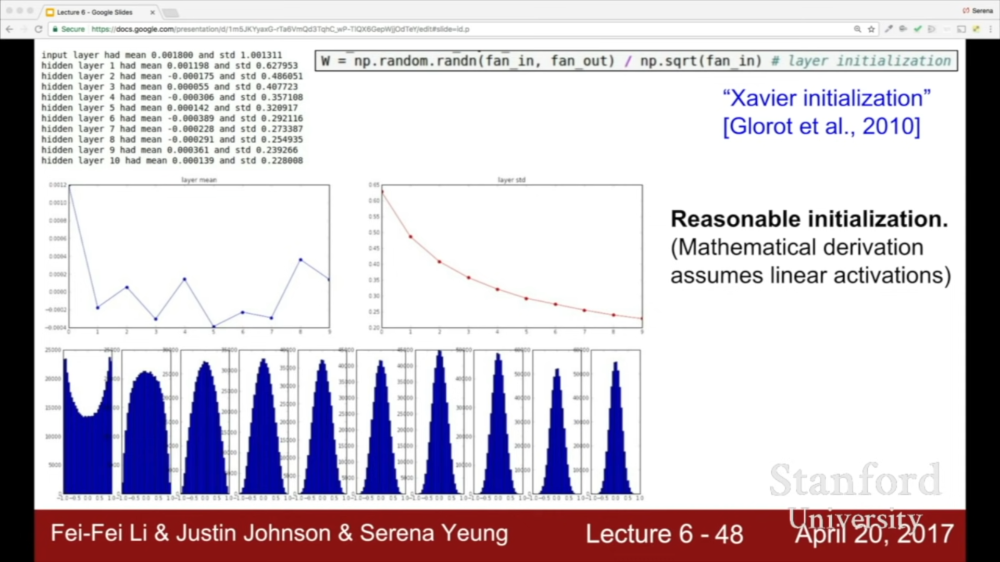

Using Xavier (Glorot) Initialization with ReLU Activations: Challenges and Solution

**Xavier Initialization** was developed for activation functions that produce both positive and negative outputs, like sigmoid and tanh. It scales weights by the inverse square root of the number of neurons, aiming to keep activations stable across layers. However, when used with ReLU activation functions, it may cause some issues:

1. **Positive-Only Output**: ReLU activations are not zero-centered, leading to a shift in mean activation values across layers. This can cause either the signal to shrink or grow as it propagates, making stable training challenging.
  
2. **Dead Neurons**: If the weights are improperly scaled, ReLU activations can result in regions where the neuron outputs zero indefinitely. This leads to "dead neurons," reducing the network's capacity to learn.

>  Solution: He Initialization for ReLU

##### 2- **He Initialization** :

**He Initialization** (or Kaiming Initialization) was specifically designed for ReLU and its variants. It scales weights by the square root of \( \frac{2}{n} \) (where \( n \) is the number of input units in a layer). This ensures:

- **Stable gradients and activations** across layers.
- **Reduced risk of dead neurons** by keeping activations in an effective range.
- **Faster and more efficient convergence**, making it ideal for ReLU-based networks.

These weight initialization methods help ensure activations remain within a manageable range and gradients flow efficiently, which prevents issues like exploding or vanishing gradients.

### Conclusion

Choosing the appropriate weight initialization method is crucial for stable and effective training in CNNs. While Xavier Initialization is suitable for activation functions like sigmoid and tanh, He Initialization is preferred when using ReLU, as it addresses the specific challenges posed by ReLU activations.

---

## 7.4 Batch Normalization

Batch Normalization (BatchNorm) is a technique designed to improve the training of deep neural networks by addressing issues such as internal covariate shift and allowing the network to converge more quickly. It is particularly useful in networks that are deep and have many layers, where the distribution of activations can shift as the network parameters are updated during training.

### Purpose and Mechanism

BatchNorm works by normalizing the activations of each layer so that they have a stable distribution with a mean of zero and a variance of one, known as a **unit Gaussian**. The key steps involved are:

1. **Compute the Empirical Mean and Variance**: For a given batch of activations, compute the mean and variance of each dimension independently. This helps to adjust for internal covariate shift — the phenomenon where the distribution of inputs to a given layer changes during training as the parameters of the previous layers change.

![](https://miro.medium.com/v2/resize:fit:720/format:webp/1*H9z4giCmcQbZIBjdcNPkrQ.png)


2. **Normalize**: The activations for each dimension are then scaled and shifted based on the computed mean and variance, effectively ensuring that the activations are centered around zero and have unit variance (a unit Gaussian).

   > **“You want unit Gaussian activations? Just make them so.”**  
   — Ioffe and Szegedy, 2015

### Typical Placement

Batch Normalization is typically inserted:
- **After Fully Connected or Convolutional layers**.
- **Before the nonlinearity (activation function)**, such as ReLU or Sigmoid.

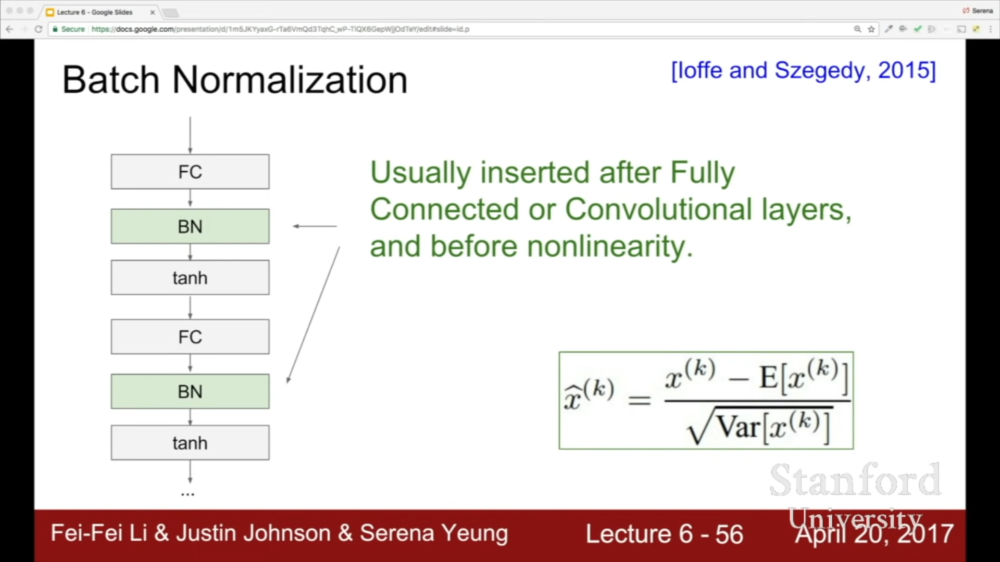

This placement ensures that the activations are normalized before they undergo any nonlinear transformations, which can help to prevent the network from becoming stuck in areas of the activation function where gradients are either too small or too large.

### Considerations for Tanh Activation

One question that arises with BatchNorm is whether we necessarily want a unit Gaussian input for every activation function. For example, for **tanh** activations, the input range is important because the tanh function squashes inputs into a [-1, 1] range. A unit Gaussian with a mean of 0 and variance of 1 could produce inputs that are outside of this range, leading to saturation and a loss of gradient during backpropagation. 

However, the network can learn to adjust and recover the identity mapping if needed, allowing it to bypass the normalization step in specific layers when it is advantageous.

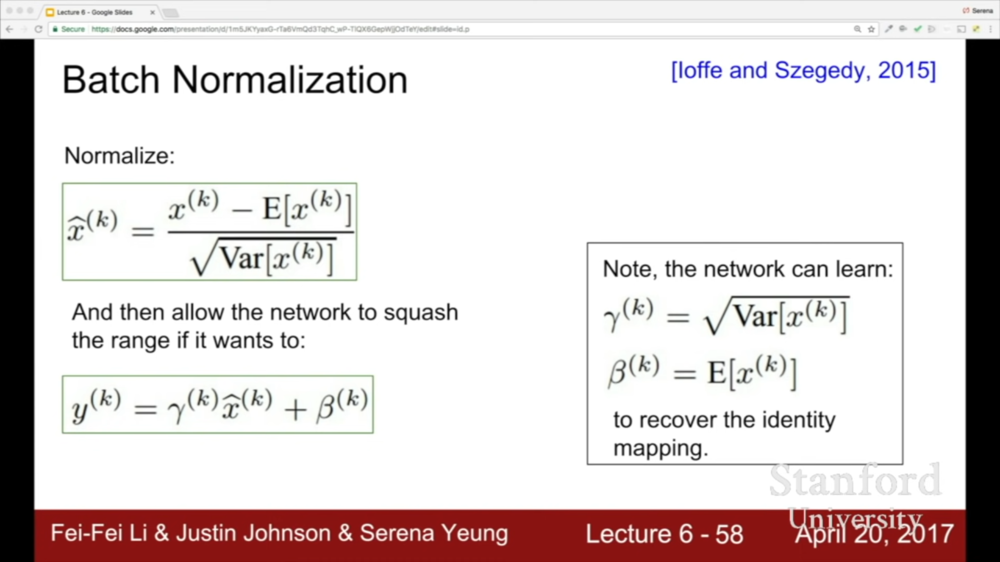

### Benefits of Batch Normalization

Batch Normalization offers several advantages:

1. **Improves Gradient Flow**: By normalizing activations, BatchNorm helps to maintain a more stable distribution of activations throughout the network, making it easier for gradients to propagate back through the layers during training. This leads to more efficient training and faster convergence.

2. **Allows Higher Learning Rates**: Because BatchNorm reduces the risk of gradient explosion or vanishing gradients, higher learning rates can be used during training, leading to faster convergence and more robust training.

3. **Reduces Dependence on Initialization**: BatchNorm reduces the reliance on careful weight initialization. With BatchNorm in place, the network becomes less sensitive to initial weights, which makes the network more robust and easier to train.

4. **Acts as a Regularizer**: Interestingly, BatchNorm has a slight regularizing effect. It can reduce overfitting and, in some cases, might reduce the need for techniques like dropout, though this is not its primary purpose.

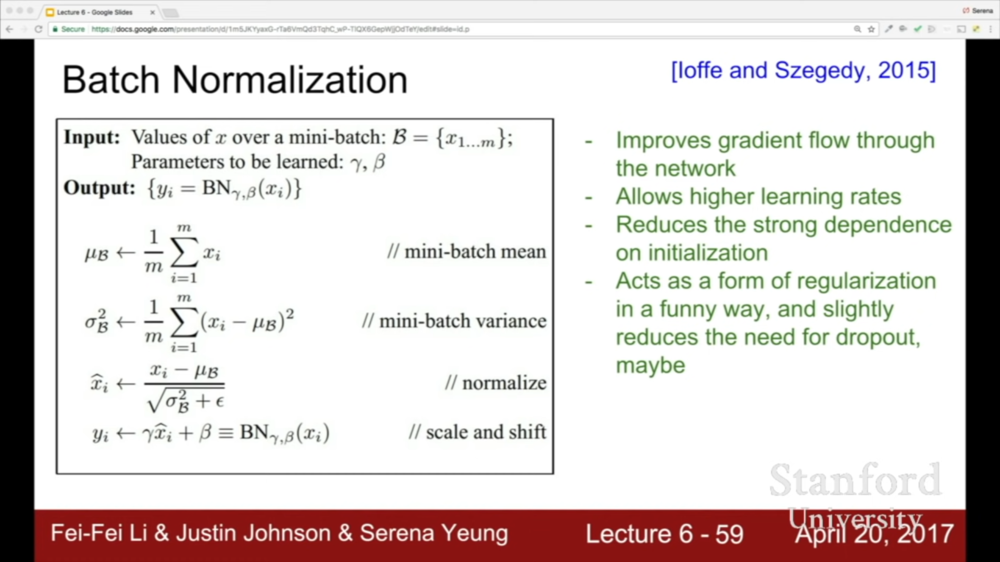


| **Aspect**                    | **Gamma and Beta in Batch Normalization**                                   | **β₁ and β₂ in Adam Optimizer**                                         |
|--------------------------------|----------------------------------------------------------------------------|------------------------------------------------------------------------|
| **Purpose**                    | Scale and shift normalized activations to allow flexibility in learning.  | Control moving averages of gradients and squared gradients for adaptive updates. |
| **Role in Training**           | Learnable parameters updated during backpropagation to adjust activations. | Hyperparameters set before training, not learned during training.      |
| **Context**                    | Part of the network's architecture, affecting activations at each layer.  | Part of the optimization process, influencing weight updates.           |
| **Learning**                   | Updated during training based on loss and activations.                    | Not updated during training; fixed before training begins.             |
| **Function**                    | Normalize activations and reintroduce flexibility via scaling (gamma) and shifting (beta). | Control the decay rates for moving averages of the first and second moments. |
| **Effect on Network**          | Stabilizes training by normalizing activations and enabling better gradient flow. | Helps with adaptive learning rates and improves convergence efficiency.  |


### Batch Normalization at Test Time

At **test time**, BatchNorm operates differently than during training:

- **No Batch Mean/Variance Computation**: During testing, the mean and variance are **not computed** based on the current batch of data. Instead, a fixed set of statistics is used — typically, the **running averages** of the mean and variance computed during training.
  
- **Running Averages**: These running averages are updated during training and are used at test time to ensure the normalization is consistent across training and inference phases.

### Conclusion

Batch Normalization improves the efficiency and stability of deep neural networks by normalizing activations and helping to mitigate issues like internal covariate shift. By allowing for higher learning rates, reducing the need for careful initialization, and acting as a form of regularization, BatchNorm has become a standard technique in many state-of-the-art neural network architectures.


---
## 7.5 Babysitting the Learning Process

**Babysitting the learning process** refers to the ongoing task of monitoring and managing a machine learning model during its training phase. This ensures that it’s progressing well and making meaningful improvements over time. There are key steps to this process:

### Step 1: Preprocess the data:
Data preprocessing is a crucial step in preparing your data for the model. It includes operations like normalizing or standardizing features, handling missing values, encoding categorical variables, and performing data augmentation if needed. Well-preprocessed data ensures the model can learn patterns more efficiently and effectively.

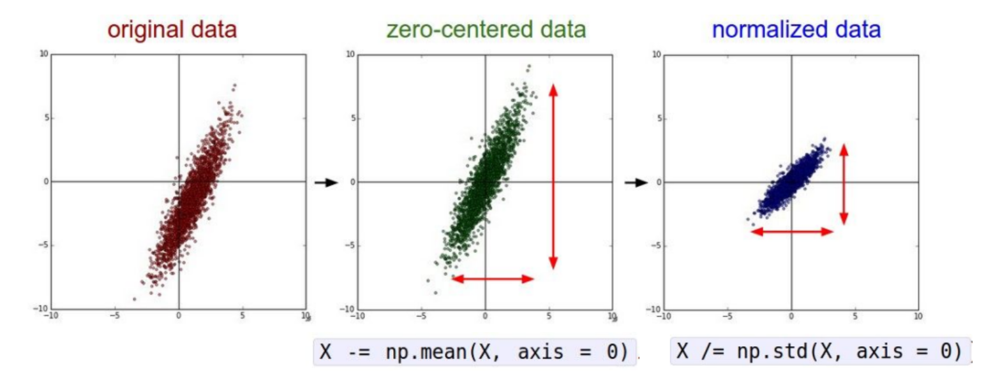

### Step 2: Choose the architecture:
Choosing the right architecture is fundamental for a model's success. It involves selecting the type of model (e.g., neural network, decision tree, etc.) and deciding on the specific structure (e.g., number of layers in a neural network, the type of activation functions). This decision can significantly influence how well the model learns from the data, how fast it converges, and whether it overfits or underfits.

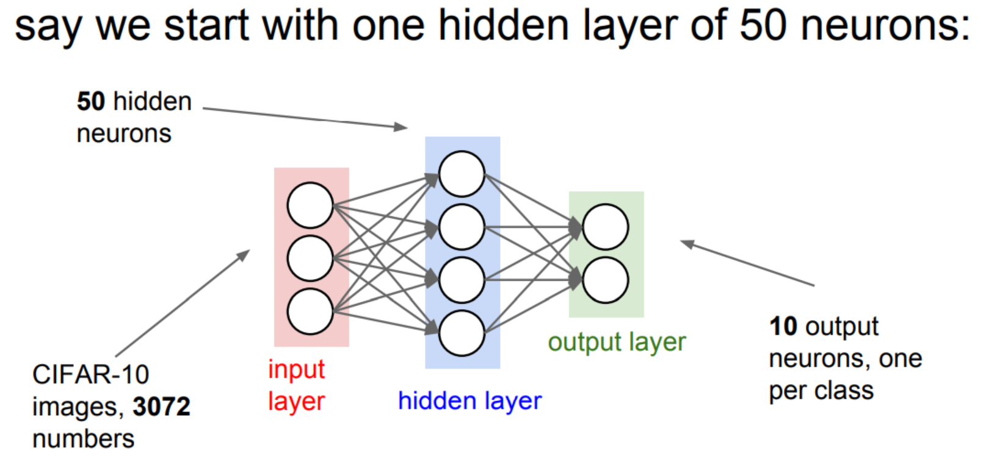

### Step 3: Double check loss:
It is essential to regularly check that the model's loss is reasonable during training. A few key checks include:

- **Ensure Loss Is Reasonable:**
  - When first running the model, ensure that the loss value is within an expected range (e.g., around 2.3 for classification with 10 classes). This can be a sanity check to ensure the model is not making nonsensical predictions.
  - **Disable regularization** initially for simplicity when double-checking the loss. A higher regularization strength may artificially increase the loss, and starting with regularization disabled helps isolate other issues.

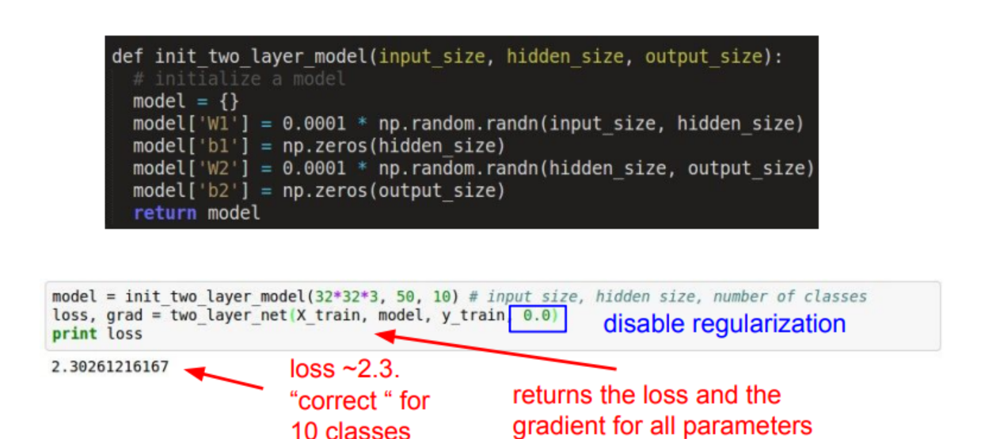

- **Adjust Regularization:**
  - After disabling regularization, gradually crank up regularization strength (L2 or Dropout). If the loss increases as expected, this indicates that regularization is functioning correctly and is adding constraints to the model.
  - If the loss stays constant or decreases unexpectedly, it suggests a deeper issue with the model’s architecture or training setup.

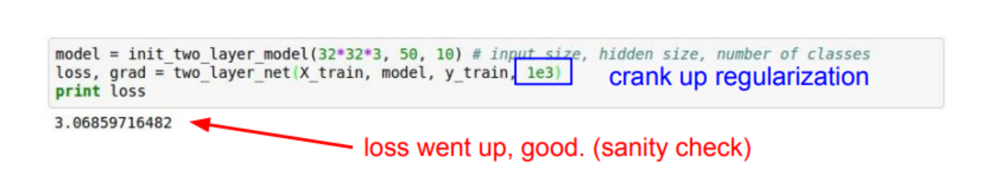

- **Overfitting Small Data Subset:**
  - A quick test for overfitting is to use a very small subset of the data. Try training on the first 20 examples of the CIFAR-10 dataset, for example, and turn off regularization (set `reg = 0.0`). If the model can quickly achieve a high training accuracy (e.g., 1.00 or 100%), then the training process is functioning correctly.

- **Learning Rate Adjustment:**
  - If the loss is barely changing, it often indicates that the learning rate is too low. Try experimenting with different learning rates and observe the impact on the loss. The goal is to find a rate where the loss begins to decrease steadily.
  - If the loss explodes (e.g., `NaN` values), the learning rate is likely too high, and it needs to be reduced. 

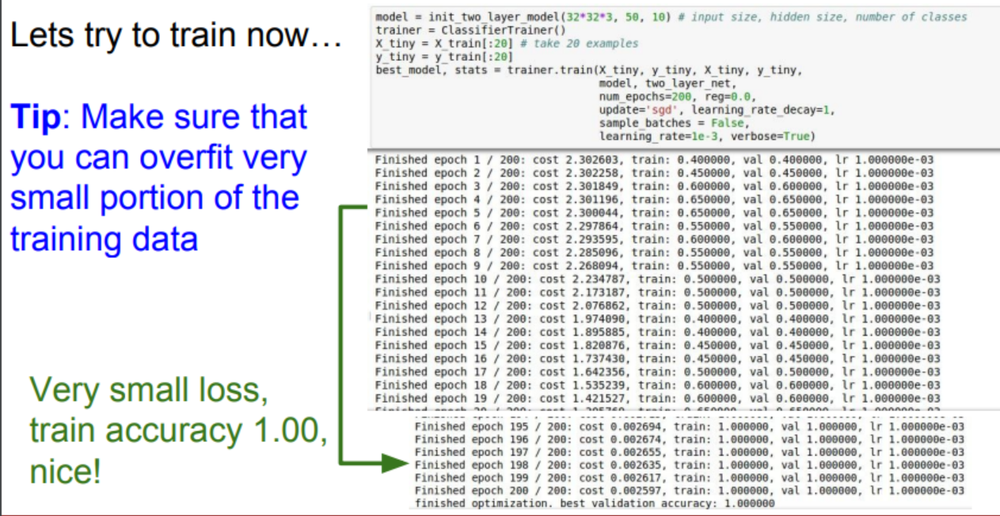
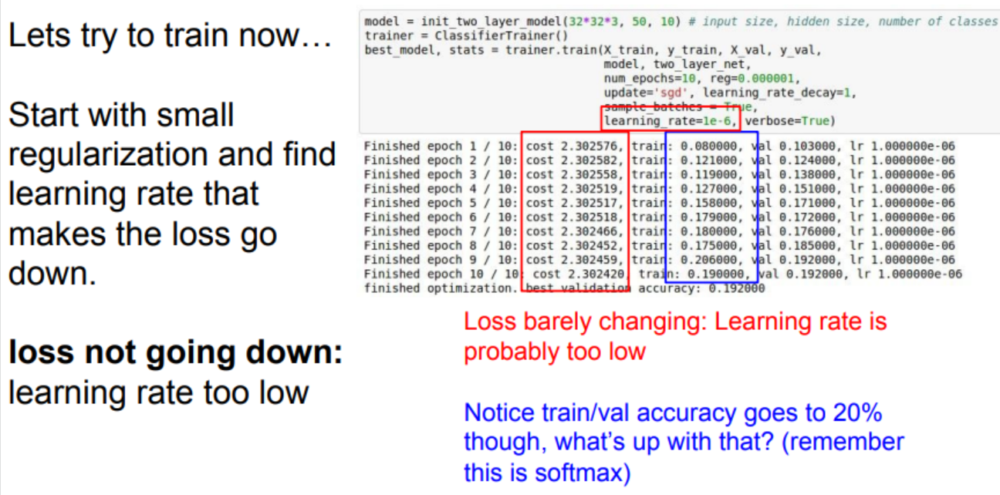

- **Monitor Train/Validation Accuracy:**
  - Keep an eye on the train/validation accuracy. If both drop to a low value (e.g., around 20%), it suggests that the model is struggling to make meaningful predictions. This often happens due to too high regularization or an insufficient learning rate.

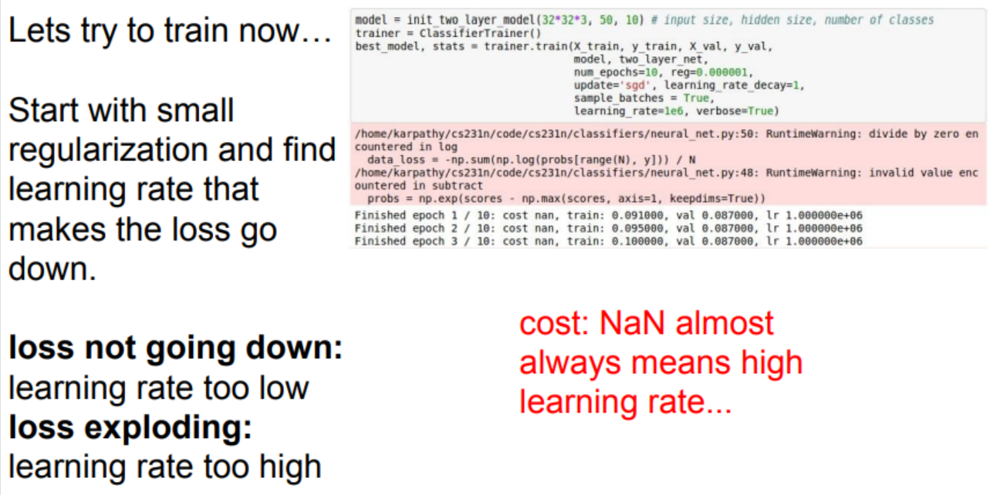

  
- **Fine-tuning the Learning Rate:**
  - As you adjust the learning rate, you may find that it requires a specific range. If using a learning rate of 1e-6 results in minimal progress and using a value like 1e-3 causes the cost to explode, you'll want to experiment in the range of `[1e-3 ... 1e-5]`.

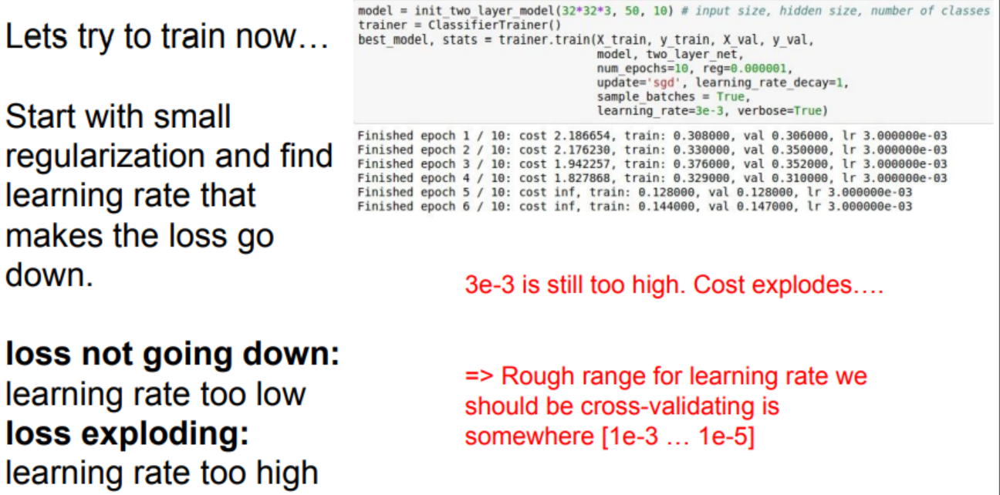


---
## 7.6 Hyperparameter Optimization

**Hyperparameter optimization** is the process of fine-tuning the hyperparameters of a model to achieve better performance. Hyperparameters control how the model learns, and finding the best combination can lead to improved accuracy, speed, and generalization.

### Cross-validation strategy:
A coarse -> fine approach in cross-validation helps optimize hyperparameters effectively across multiple stages:

- **First Stage**: Start with a coarse search using only a few epochs to get a rough idea of what parameters work. This helps to quickly eliminate non-promising configurations.

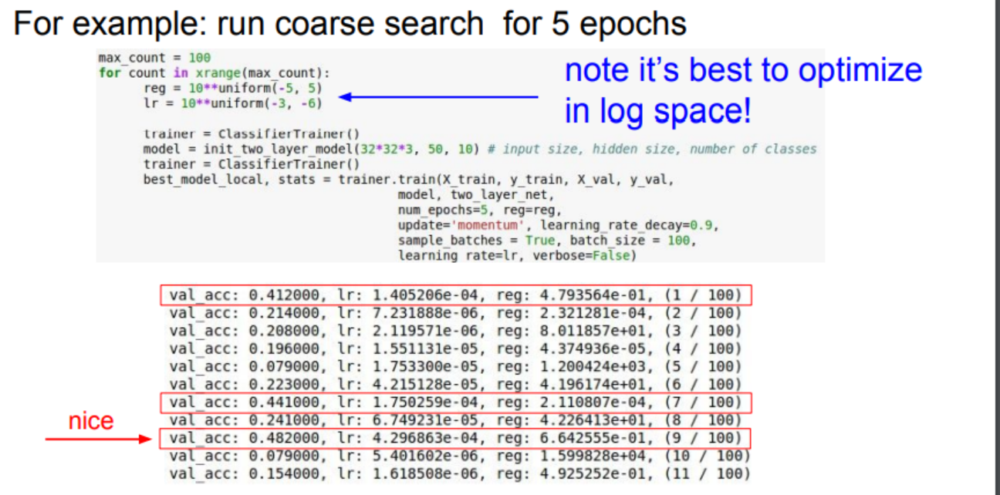

- **Second Stage**: Once rough parameters are identified, extend the training time with a finer search on the remaining parameters. This will lead to better performance and more precise hyperparameter tuning.

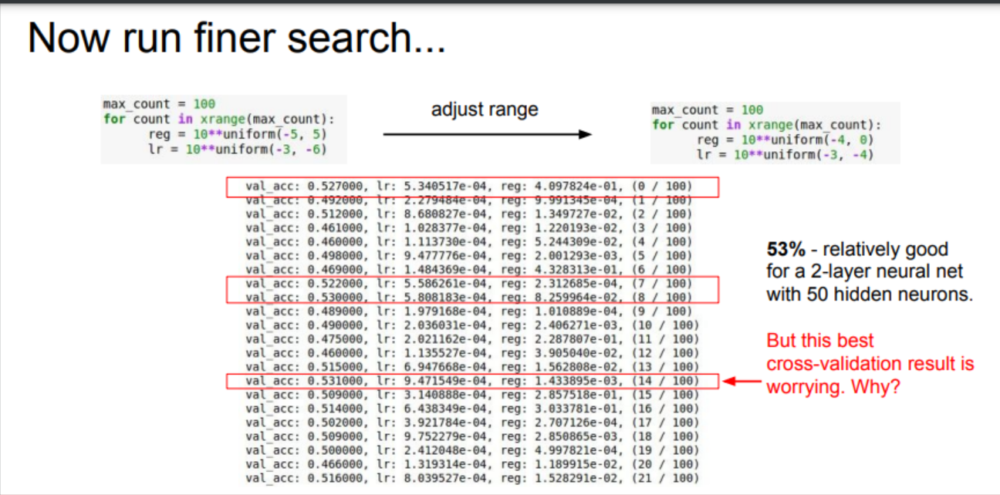

- **Repeat as necessary** to adjust ranges and refine the search further.

This staged approach ensures that you **don’t waste computational resources** on configurations that clearly don’t work while also allowing for finer adjustments as you narrow down the optimal settings.

**Tip for detecting explosions in the solver**: If the cost is ever greater than 3 times the original cost, it’s a good idea to break out of the training early to avoid wasting time on diverging values.

### Random Search vs. Grid Search:

- **Random Search**: In random search, hyperparameter values are randomly sampled from a predefined range. It is more efficient in cases with many hyperparameters because it doesn’t exhaustively search every possible combination. Random search works well with logarithmic space for certain hyperparameters like the learning rate.

- **Grid Search**: In grid search, hyperparameters are selected from a set grid of possible values, ensuring all combinations are tested. While it guarantees a thorough search, it can be computationally expensive, especially with many hyperparameters.

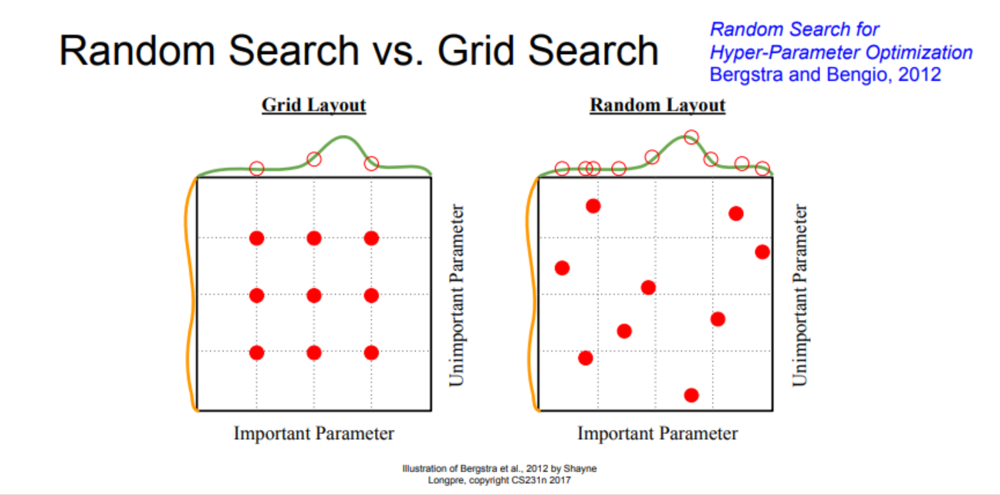

### Hyperparameters to play with:
- **Network architecture**: This refers to the design of the model itself, such as the number of layers, the number of units in each layer, and the type of activation functions.
- **Learning rate, its decay schedule, update type**: The learning rate controls how much the model weights are adjusted during each step of training. A decay schedule gradually reduces the learning rate as training progresses, preventing overshooting. The update type (e.g., SGD, Adam) determines how the weights are updated during training.
- **Regularization (L2/Dropout strength)**: Regularization techniques like L2 regularization (weight decay) and Dropout help prevent overfitting by adding penalties to the model for large weights or randomly deactivating neurons during training.

### Monitor and visualize the loss curve:
The loss curve plots the model's loss (error) over time or iterations during training. It is important to monitor this curve to ensure that the loss is decreasing steadily. If the loss plateaus or increases, it may indicate issues such as learning rate problems, overfitting, or insufficient training data. In the coarse stage of cross-validation, observing this curve over a small number of epochs can give an early indication of whether further fine-tuning is needed.

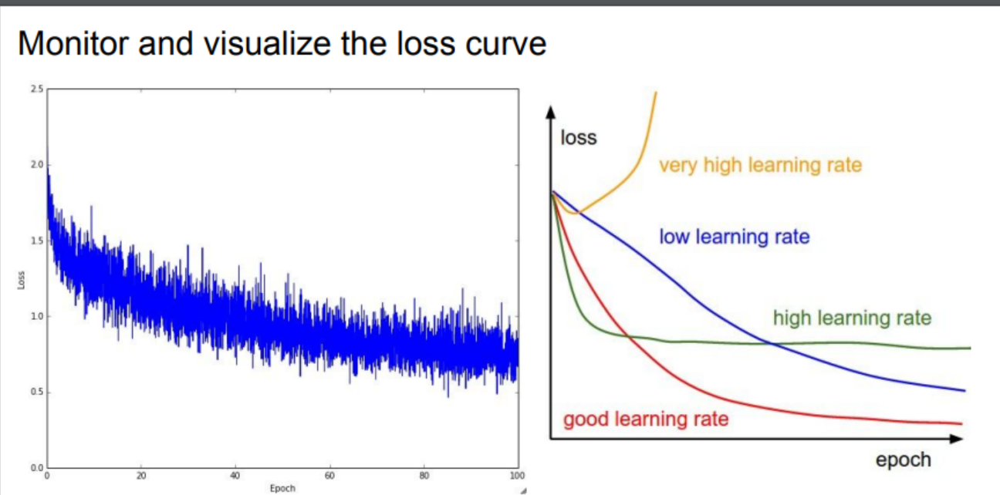

### Monitor and visualize the accuracy:
The accuracy curve plots the model’s performance over time. It helps visualize whether the model is improving, and whether it's underfitting or overfitting. In classification tasks, accuracy is a primary metric, and its curve can show how well the model is generalizing. During the coarse search phase, tracking the accuracy with a few epochs can help to quickly identify whether the model is heading in the right direction.

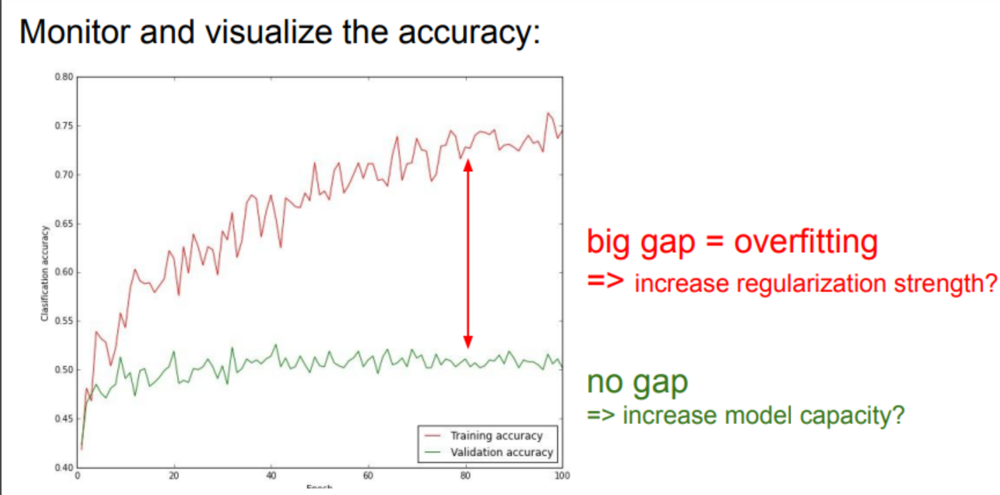

### Track the ratio of weight updates / weight magnitudes:
Tracking the ratio of weight updates to the magnitudes of the weights can help detect training problems like exploding or vanishing gradients. Large updates relative to weight magnitudes may indicate instability, while tiny updates may suggest that the model is learning too slowly. This can be monitored throughout the cross-validation stages to help adjust the learning rate or regularization.

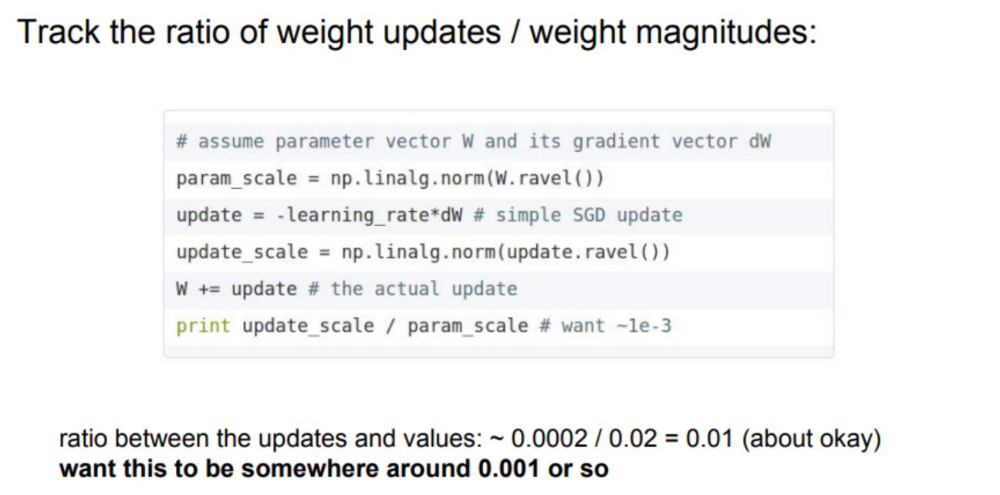

### Random sample hyperparameters, in log space when appropriate:
In hyperparameter optimization, especially when dealing with continuous values like the learning rate, it’s often better to sample values logarithmically rather than uniformly. This is because certain hyperparameters, like learning rates, often perform better on a logarithmic scale. For example, instead of testing values like 0.001, 0.01, and 0.1, you might sample values like 0.0001, 0.001, and 0.1. This technique is particularly effective when conducting the coarse phase of hyperparameter tuning.

---


## 7.7 Batch Normalization in Depth

### Generalized Batch Normalization Equations

For an input `x_i,j`, where `i` indexes the data sample in a batch, and `j` indexes the feature (channel) or spatial dimensions:

#### Normalization

```plaintext
x̂_i,j = (x_i,j - μ_j) / sqrt(σ_j^2 + ε)

```

Where:
- `x_i,j`: Input feature for sample `i`, channel `j`.
- `μ_j`: Mean of the mini-batch for feature `j`, computed as:

```plaintext
μ_j = (1 / m) * Σ_(i=1)^m x_i,j

```

- `σ_j^2`: Variance of the mini-batch for feature `j`, computed as:


```plaintext
σ_j^2 = (1 / m) * Σ_(i=1)^m (x_i,j - μ_j)^2

```

- `ε`: Small constant for numerical stability.

#### Scaling and Shifting


```plaintext
y_i,j = γ_j * x̂_i,j + β_j

```


Where:
- `γ_j`: Learnable scaling parameter for feature `j`.
- `β_j`: Learnable shift parameter for feature `j`.
- `y_i,j`: Output feature after batch normalization.


### Batch Normalization in CNNs

In Convolutional Neural Networks (CNNs), batch normalization is applied across the spatial dimensions. For a mini-batch of inputs `X` with shape `(N, C, H, W)` (batch size `N`, channels `C`, height `H`, width `W`):

##### 1. Per-Channel Statistics
1. Compute the mean and variance across `N, H, W`, independently for each channel `C`:


```plaintext
μ_c = (1 / (N * H * W)) * Σ_(n=1)^N Σ_(h=1)^H Σ_(w=1)^W x_n,c,h,w

```

```plaintext
σ_c^2 = (1 / (N * H * W)) * Σ_(n=1)^N Σ_(h=1)^H Σ_(w=1)^W (x_n,c,h,w - μ_c)^2

```

##### 2. Normalization

```plaintext
x̂_n,c,h,w = (x_n,c,h,w - μ_c) / sqrt(σ_c^2 + ε)

```

##### 3. Scaling and Shifting

```plaintext
y_n,c,h,w = γ_c * x̂_n,c,h,w + β_c

```

### Summary of Frameworks

#### TensorFlow Implementation

In TensorFlow, batch normalization can be implemented using the `tf.keras.layers.BatchNormalization` layer. The corresponding equations align with the generalized batch normalization formulation.

##### Key Parameters:
- **momentum**: Controls the moving average of `μ` and `σ^2` during training for inference use.
- **epsilon**: The small constant added to variance for numerical stability.

###### Example in TensorFlow:
```python
import tensorflow as tf

bn_layer = tf.keras.layers.BatchNormalization(momentum=0.9, epsilon=1e-5)
```

#### PyTorch Implementation

In PyTorch, batch normalization is implemented using the `torch.nn.BatchNorm1d`, `BatchNorm2d`, or `BatchNorm3d` classes for 1D, 2D, and 3D data, respectively.

##### Key Parameters:
- **momentum**: Used for the running mean and variance.
- **eps**: The epsilon value for numerical stability.

###### Example in PyTorch:
```python
import torch
import torch.nn as nn

bn_layer = nn.BatchNorm2d(num_features=64, momentum=0.9, eps=1e-5)
ensions.
```

Both frameworks implement this generalized approach for convolutional layers to ensure proper scaling and normalization across feature maps.

---

## 7.8 Fancier optimization | Regularization | Transfer Learning


### 7.8.1 optimization

#### Comparison of Optimizers in Machine Learning and Deep Learning

The following table compares commonly used optimizers based on their characteristics, type, and update equations.

| Optimizer      | Type            | Characteristics                                                                                                                                 | Update Equation                                                                                                                                                 | Advantages                                                                                               | Disadvantages                                                                                          |
|----------------|-----------------|-------------------------------------------------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------------------------------------------------------------|---------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------|
| **SGD**        | First-Order     | Vanilla Stochastic Gradient Descent. Updates weights based on the gradient of the loss function.                                               | w = w - lr * ∇L(w)                                                                                                                                            | Simple, efficient for convex problems.                                                                | Prone to oscillations, slow convergence.                                                              |
| **SGD+Momentum**| First-Order    | Adds a momentum term to accelerate convergence in the relevant direction and reduce oscillations.                                               | v = β * v + (1 - β) * ∇L(w); w = w - lr * v                                                                                                                   | Reduces oscillations, speeds up convergence.                                                           | Requires tuning of the momentum hyperparameter.                                                       |
| **Adagrad**    | First-Order     | Adapts learning rate based on past gradients, performing larger updates for infrequent parameters.                                               | g = g + ∇L(w)^2; w = w - (lr / √(g + ε)) * ∇L(w)                                                                                                              | Works well for sparse data, no need to tune learning rate manually.                                     | Learning rate decays quickly, making it unsuitable for longer training.                               |
| **RMSProp**    | First-Order     | Keeps an exponentially decaying moving average of squared gradients for stable learning rate adaptation.                                         | g = β * g + (1 - β) * ∇L(w)^2; w = w - (lr / √(g + ε)) * ∇L(w)                                                                                               | Handles non-stationary objectives well, avoids rapid learning rate decay.                              | Sensitive to hyperparameters like β and learning rate.                                                |
| **Adadelta**   | First-Order     | A variant of Adagrad that limits the accumulation of past gradients to prevent rapid decay of learning rate.                                     | Δw = - (√(E[Δw^2] + ε) / √(E[g^2] + ε)) * ∇L(w); w = w + Δw                                                                                                    | No need to set initial learning rate, resolves rapid decay issues in Adagrad.                          | Complex implementation, more computationally expensive.                                               |
| **Adam**       | First-Order     | Combines momentum and adaptive learning rates. Maintains per-parameter learning rates that improve performance.                                  | m = β1 * m + (1 - β1) * ∇L(w); v = β2 * v + (1 - β2) * (∇L(w))^2; w = w - (lr * m / (√(v) + ε))                                                                | Fast convergence, handles sparse gradients, widely used.                                               | Sensitive to hyperparameters (β1, β2).                                                                |
| **Nadam**      | First-Order     | Adam optimizer with Nesterov momentum, providing better convergence properties in some scenarios.                                                | m = β1 * m + (1 - β1) * ∇L(w); v = β2 * v + (1 - β2) * (∇L(w))^2; w = w - (lr * (m + β1 * ∇L(w)) / (√(v) + ε))                                                | Faster convergence in some cases, combines benefits of Adam and Nesterov momentum.                     | More computationally expensive than Adam.                                                              |
| **AdaMax**     | First-Order     | A simplified version of Adam that uses infinity norm for weight updates, making it more stable in some scenarios.                                | m = β1 * m + (1 - β1) * ∇L(w); v = max(β2 * v, |∇L(w)|); w = w - (lr * m / v)                                                                                 | Robust to noisy gradients, simpler than Adam.                                                          | Can be slower than Adam in some cases.                                                                |
| **AMSGrad**    | First-Order     | A variant of Adam that ensures the monotonic decrease of learning rate to avoid oscillations.                                                    | v = max(v, ∇L(w)^2); m = β1 * m + (1 - β1) * ∇L(w); w = w - (lr * m / (√(v) + ε))                                                                             | Resolves oscillation issues in Adam.                                                                   | Slower convergence compared to Adam in some cases.                                                    |
| **Newton's Method** | Second-Order| Uses second-order derivative (Hessian matrix) for optimization. Suitable for convex problems.                                                   | w = w - (H^(-1) * ∇L(w))                                                                                                                                    | Precise updates for convex problems, faster convergence for certain functions.                         | Computationally expensive, requires computation of Hessian matrix.                                     |
| **BFGS**       | Second-Order    | An approximation of Newton's method, avoiding explicit computation of the Hessian.                                                              | Similar to Newton's method but with approximated H^(-1).                                                                                                      | Efficient compared to Newton's method, works well for smaller datasets.                               | Less effective for very large-scale problems.                                                         |
| **L-BFGS**     | Second-Order    | A memory-efficient version of BFGS, suitable for large-scale optimization tasks.                                                                | Similar to BFGS but uses limited memory for H^(-1) approximation.                                                                                           | Efficient for high-dimensional data.                                                                   | Can be challenging to tune for very deep networks.                                                    |

**Key Notes**:
- **First-Order Optimizers**: Use gradient information to update weights; computationally cheaper but may converge slower.
- **Second-Order Optimizers**: Use both gradient and curvature (Hessian) information; better convergence properties but are computationally intensive.
- **Choosing an Optimizer**: Selection depends on the problem at hand, the size of the dataset, computational resources, and convergence speed requirements.


#### In the Context of Convolutional Neural Networks (CNNs): Adam's Limitations

Adam (short for Adaptive Moment Estimation) is a widely used optimization algorithm for training deep learning models, including CNNs. However, there are certain issues or limitations that Adam may not inherently fix or address:

##### 1. Overfitting
- Adam does not inherently prevent overfitting in CNNs.
- Overfitting occurs when the model learns noise or irrelevant details from the training data, leading to poor generalization to unseen data.
- While Adam helps optimize weights efficiently, techniques like **regularization** (e.g., L2 regularization, dropout) and **data augmentation** are required to tackle overfitting.

##### 2. Vanishing/Exploding Gradients
- Adam does not inherently solve the **vanishing gradient** or **exploding gradient** problems, common in very deep networks.
- While Adam’s adaptive learning rates stabilize training, it doesn't address issues caused by activation functions like sigmoid or tanh.
- Solutions include using activation functions like **ReLU** or **Leaky ReLU**, or employing **gradient clipping**.

##### 3. Choice of Learning Rate
- Despite adaptive learning rates, the **initial learning rate** still plays a significant role.
- If poorly chosen, it may lead to suboptimal performance.
- **Tuning the learning rate** is often necessary for specific tasks and datasets.

##### 4. Local Minima/Plateaus
- Adam does not guarantee escaping **local minima** or **plateaus** in the loss landscape.
- Optimizers like **SGD with momentum** or **Nesterov Accelerated Gradient (NAG)** might perform better in such cases.
- No optimizer completely avoids local minima or plateaus.

##### 5. Hyperparameter Sensitivity
- Adam requires tuning several hyperparameters (e.g., **learning rate, β1, β2, ε**).
- Poor choices for these values can degrade performance.
- While Adam is less sensitive to the learning rate than standard SGD, **hyperparameter tuning** remains essential.

##### 6. Optimization in High-Dimensional Spaces
- Adam may struggle in certain **high-dimensional optimization tasks** or with very large, complex datasets.
- Alternatives like **AdamW (Adam with weight decay)** or **RMSProp** might work better in such cases.

##### 7. Memory Usage
- Adam consumes more memory than simpler optimizers like SGD due to the additional storage of moving averages for gradients and squared gradients.
- This can be problematic in **memory-constrained environments**, especially with large-scale CNNs.

#### Conclusion
While Adam is a powerful and effective optimizer for CNN training tasks, it does not address issues such as overfitting, vanishing gradients, or local minima on its own. To handle these challenges, other techniques like **regularization**, **alternative activation functions**, **learning rate schedules**, and **careful network architecture design** should be used in conjunction with Adam.



#### Learning Rate Decay: An Essential Concept

Learning rate decay is a crucial technique to enhance the performance and convergence of optimization algorithms like **SGD, SGD+Momentum, Adagrad, RMSProp, and Adam**. All of these optimizers rely on the **learning rate** as a hyperparameter to control the step size during optimization.

#### Why Learning Rate Decay?
- A constant learning rate might not always lead to optimal convergence.
- **High learning rates** can cause the optimizer to overshoot the minima, while **low learning rates** may slow down convergence or trap the model in suboptimal minima.
- Decaying the learning rate helps balance the trade-off between exploration (larger steps) and exploitation (smaller, precise steps).

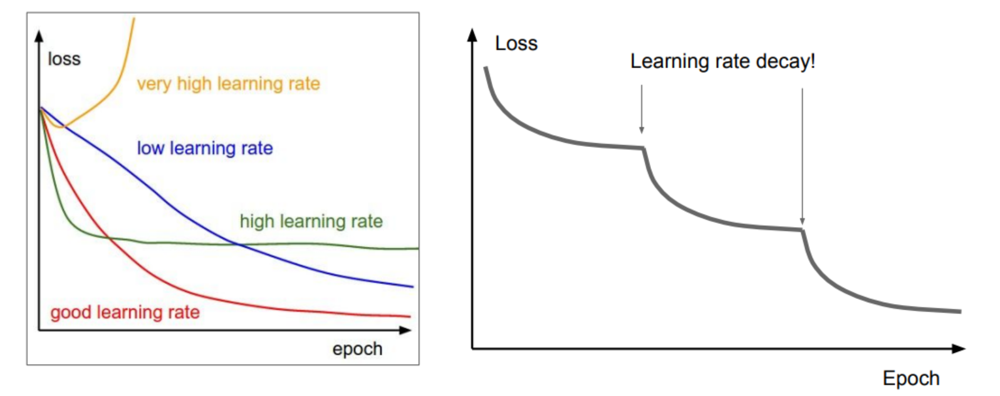

#### Types of Learning Rate Decay

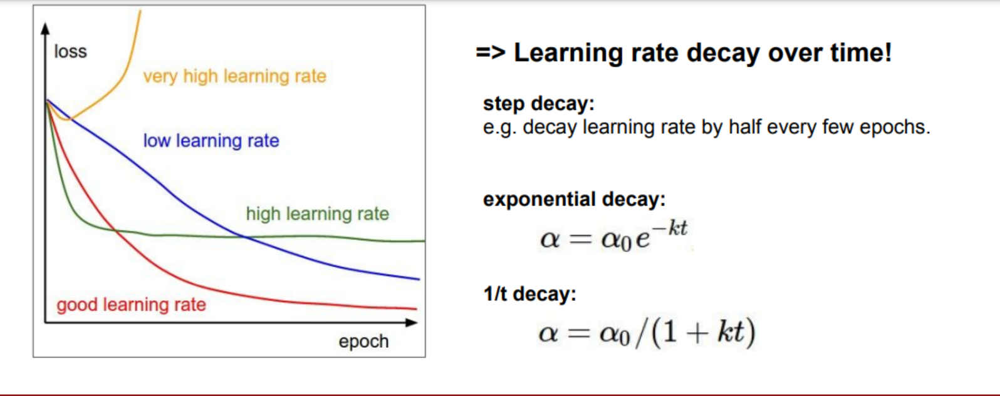

1. **Step Decay**
   - The learning rate is reduced by a fixed factor (e.g., halved) every few epochs.
   - This creates a stepwise decrease in the learning rate over time.
   - Example:
     - Initial learning rate: 0.1
     - Decay factor: 0.5
     - Every 10 epochs: Learning rate = Learning rate × Decay factor
   - Common in traditional machine learning pipelines.

2. **Exponential Decay**
   - The learning rate decreases exponentially over epochs.
   - Formula:
     ```
     learning_rate = initial_learning_rate * exp(-decay_rate * epoch)
     ```
   - Offers a smooth and continuous decay.

3. **1/t Decay**
   - The learning rate decays inversely proportional to time (epochs).
   - Formula:
     ```
     learning_rate = initial_learning_rate / (1 + decay_rate * epoch)
     ```
   - Gradual decay suitable for slower convergence tasks.

#### Importance of Learning Rate Decay in Different Optimizers
- **SGD and SGD+Momentum**:
  - Learning rate decay is **more critical** because these optimizers do not adapt the learning rate dynamically for individual parameters.
  - Decay helps stabilize convergence and prevents oscillations near the minima.

- **Adagrad and RMSProp**:
  - These optimizers inherently adjust learning rates based on the gradients, but a decaying global learning rate can still improve their performance over time.

- **Adam**:
  - While Adam adapts learning rates per parameter, learning rate decay can enhance performance in complex or high-dimensional tasks.
  - Decay is **less commonly used** with Adam compared to SGD-based methods, but it can still be valuable for fine-tuning.

#### Learning Rate Decay and Loss
- A well-decayed learning rate typically results in smoother and faster reduction of the **loss function** across epochs.
- Without decay, models may oscillate or converge prematurely to suboptimal points.

#### Practical Considerations
- Always monitor the model's performance when applying learning rate decay.
- Combine decay schedules with techniques like **early stopping** to prevent overfitting or excessive training.
- Use frameworks like **TensorFlow** and **PyTorch** that provide built-in functions for implementing learning rate decay, such as:
  - TensorFlow: `tf.keras.optimizers.schedules`
  - PyTorch: `torch.optim.lr_scheduler`

#### Second-Order Optimization: A Summary

Second-order optimization techniques leverage information from both the gradient and the Hessian (second-order derivatives) to optimize a loss function. These methods aim to take more informed steps compared to first-order methods like SGD, potentially leading to faster convergence.


#### Key Steps in Second-Order Optimization
1. **Quadratic Approximation**:
   - The loss function is approximated using a second-order Taylor expansion:
     ```
     Loss(w) ≈ Loss(w0) + gradient(w0) * (w - w0) + 0.5 * (w - w0)^T * Hessian(w0) * (w - w0)
     ```
2. **Newton Update**:
   - The critical point is found by solving:
     ```
     w_new = w - (Hessian)^(-1) * gradient
     ```


#### Advantages of Second-Order Optimization
- **No Hyperparameters**:
  - Second-order methods do not require manually tuning the learning rate, as the Hessian inherently adjusts step sizes.
- **Faster Convergence**:
  - By incorporating curvature information, second-order methods can converge faster in some cases, especially in well-behaved loss landscapes.


#### Challenges in Deep Learning
1. **Computational Complexity**:
   - The Hessian has \(O(N^2)\) elements, and inverting it requires \(O(N^3)\) operations.
   - For deep learning models with millions of parameters, this becomes computationally infeasible.

2. **Memory Requirements**:
   - Storing the Hessian or its approximations requires significant memory, limiting its practicality for large-scale problems.

3. **Mini-Batch Incompatibility**:
   - Methods like L-BFGS are designed for deterministic, full-batch settings and perform poorly with stochastic mini-batches common in deep learning.


#### Alternatives and Approximations
1. **Quasi-Newton Methods**:
   - Approximate the inverse Hessian using rank-1 updates over time, reducing computation to \(O(N^2)\) per iteration.
   - Example: BFGS (Broyden-Fletcher-Goldfarb-Shanno).

2. **L-BFGS (Limited-memory BFGS)**:
   - Does not store the full Hessian, making it more memory efficient.
   - Performs well in full-batch, deterministic optimization tasks but struggles with mini-batch stochastic training.


#### Practical Insights
- **L-BFGS**:
  - Suitable for full-batch training with deterministic loss functions.
  - Requires disabling sources of noise, such as random mini-batches or dropout, to perform effectively.

- **Adam as a Default**:
  - For most deep learning tasks, Adam is a reliable choice due to its balance between speed, adaptivity, and ease of use.
  - Second-order methods like L-BFGS may only be beneficial when full-batch updates are affordable

#### Conclusion
Second-order optimization methods offer theoretical benefits and work well in certain deterministic settings. However, their high computational and memory demands, combined with poor compatibility with stochastic training, limit their use in large-scale deep learning. For practical deep learning scenarios, adaptive first-order methods like **Adam** remain the default choice.

---

### 7.8.2 Regularization

### Beyond Training Error

Better optimization algorithms help reduce training loss. However, what we really care about is how well the model performs on new data (generalization). To address the gap between training error and new data error, there are various strategies we can use during training and testing. One such method is **ensemble learning**.

1. Train multiple independent models.  
2. At test time, average their results.  
This simple method can yield 2% extra performance by averaging the predictions of multiple models.

### Model Ensembles: Tips and Tricks

Ensemble methods improve the robustness and accuracy of machine learning models.  
**Model Ensembles** involve combining multiple models to create a stronger predictor than any individual model. This works because different models may capture different patterns in the data, which helps reduce variance and bias.

- You can either train independent models and combine their predictions, or use snapshots of a single model at different stages of training.
- **Snapshot Ensembles** involve training a single model and saving it at multiple points during training. These snapshots can then be used at test time to improve performance.


Instead of training completely independent models, you can create multiple snapshots of a single model during training. This is effective when paired with **cyclic learning rate schedules**, which periodically increase and decrease the learning rate, making training more efficient and stable.

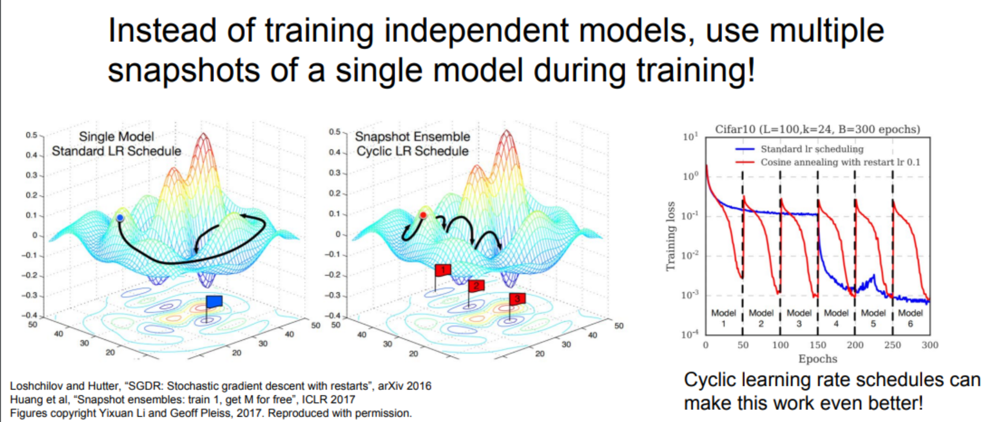

- **SGDR (Stochastic Gradient Descent with Restarts)** uses a cyclical learning rate to reset the optimizer at regular intervals, leading to better generalization.
- **Snapshot Ensembles** take advantage of the cyclical learning rate and train multiple models from different points of training, thereby creating an ensemble of models that share parameters but exhibit diverse behaviors.


Instead of maintaining multiple models, you can keep a moving average of the parameters of a single model and use that averaged model during testing. This method, called **Polyak Averaging**, is based on the idea that averaging over several iterations of a model's parameters can reduce overfitting and improve generalization.

- Polyak Averaging computes the running average of the model's parameters, which helps the model stabilize and avoid fluctuations in the loss during training.

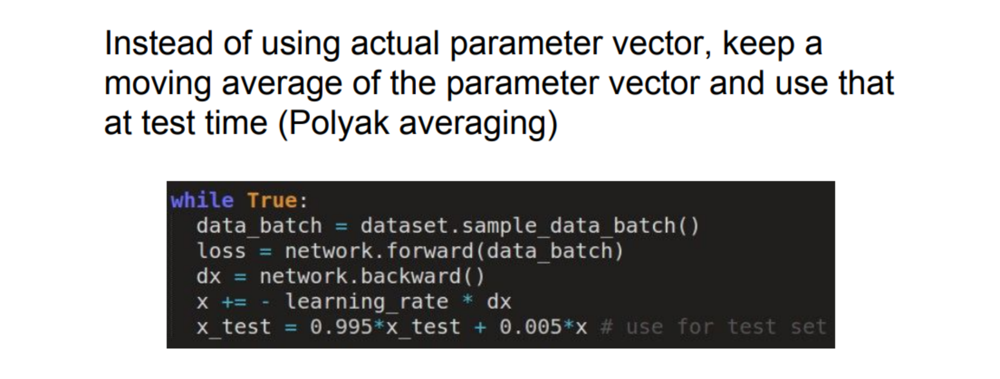

### How to Improve Single-Model Performance? Regularization

Improving model performance is not just about optimization but also regularization techniques, which help prevent overfitting. Regularization methods add constraints or penalties to the model's parameters to limit the complexity of the model.

- **L2 regularization**: Adds the sum of squared weights to the loss function.
- **L1 regularization**: Adds the sum of absolute values of weights to the loss function.
- **Elastic net**: A combination of L1 and L2 regularization.
- **Weight decay**: Similar to L2 regularization but applied directly during optimization.


### Regularization: Add Term to Loss

One of the most common regularization techniques is to add a penalty term to the loss function. This forces the model to minimize both the error on the training data and the complexity of the model (as measured by the size of the weights).  
Regularization helps prevent the model from fitting the noise in the training data, leading to better generalization on new, unseen data.

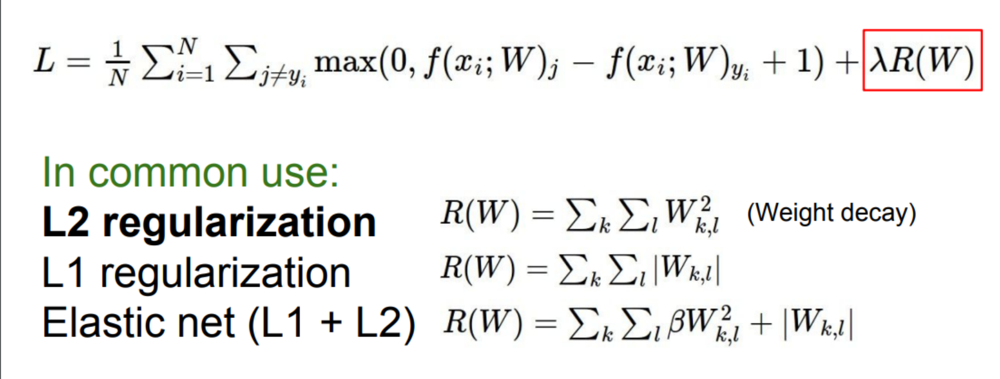

- **L2 regularization** (also called **ridge regression**) penalizes the sum of the squared values of weights.
- **L1 regularization** (also called **lasso regression**) penalizes the sum of the absolute values of weights.

### Regularization: Dropout

**Dropout** is a regularization technique where, during each forward pass, random units in the neural network are set to zero. This prevents units from co-adapting too much and forces the network to learn more redundant representations. The probability of a unit being dropped is a hyperparameter (usually set to 0.5).

- Dropout can be viewed as training an ensemble of models by randomly "dropping" parts of the network during each training step.
- The key advantage is that dropout forces the model to rely on a broader set of features, helping to reduce overfitting.

### Regularization: Dropout Example

Consider a simple neural network with three layers. During training, each forward pass will randomly drop out some neurons in each layer. The final prediction is made using the remaining neurons. This results in a network that is less likely to memorize the training data and is better at generalizing to new data.

- This can be particularly helpful in deep learning models with large numbers of parameters.

### Regularization: Dropout

How does this work? Dropout forces neurons to learn redundant representations. When a neuron is dropped, the network cannot rely on it, so it must learn another representation of the same concept. This reduces the risk of the model overfitting to the training data.

Additionally, this technique prevents "co-adaptation" of neurons, meaning that individual neurons don’t become too specialized to the training data, improving generalization.

### Dropout: Test Time

At test time, dropout can cause randomness in the network’s output because different neurons are active depending on which are dropped during training. To mitigate this, we need to **average out** the randomness during testing. We want the model to behave deterministically at test time while still capturing the variability learned during training.

### Dropout: Test Time

At test time, we use the **full model** where all neurons are active. However, since the model was trained with dropout, we must scale the outputs by the probability of a neuron being dropped during training. This ensures that the output is consistent with what the model learned during training, where neurons were randomly deactivated.

### Dropout: Test Time

To scale the activations, we adjust the output during testing by multiplying the activations by the dropout probability (the likelihood that a neuron is kept). This ensures that the model performs similarly at test time as it did during training, where some neurons were dropped randomly.

### Dropout Summary

- **Training**: Drop random neurons during the forward pass.
- **Test Time**: Use all neurons but scale the output to account for the dropout rate during training. This ensures that the model behaves consistently and performs well during both training and testing.

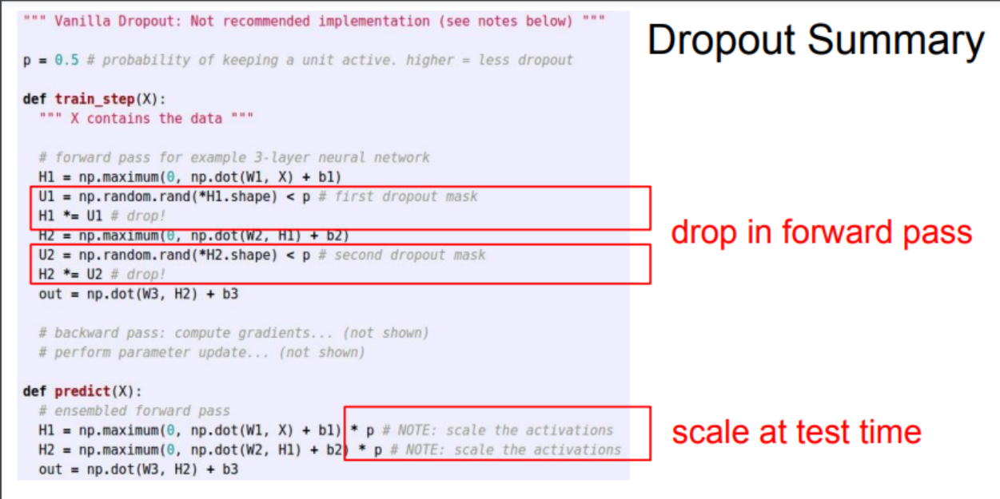

### More Common: "Inverted Dropout"

In **inverted dropout**, the dropout scaling is applied during training, so the model can be used at test time without any changes. This simplifies the implementation, as the dropout behavior is only handled during training, while test-time behavior remains unchanged.

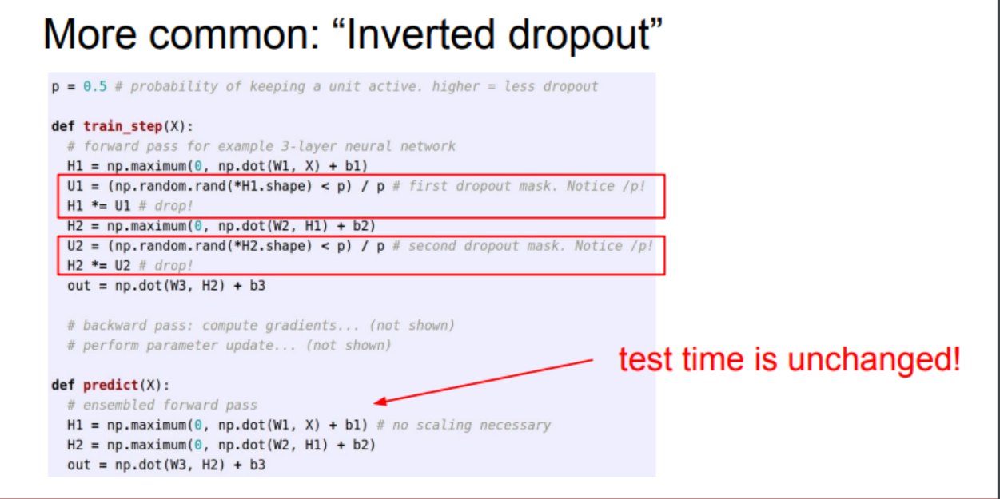

### Regularization: A Common Pattern

A common pattern in regularization is to introduce **randomness** during training and then **average out** the randomness at test time.  
This is a general principle that applies to several regularization techniques, including dropout, batch normalization, and data augmentation.

### Regularization: A Common Pattern

- **Training**: Add random noise or introduce randomness in the form of dropout or other methods.
- **Testing**: Average over the noise or use fixed statistics to smooth out the randomness.

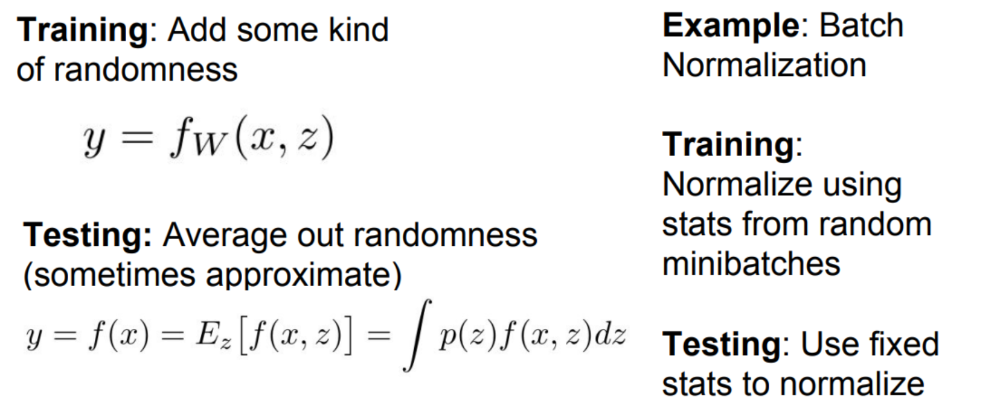

This pattern ensures that the model generalizes better and doesn't overfit to the specifics of the training data.

### Regularization: Data Augmentation

**Data augmentation** involves artificially expanding the training dataset by creating transformed versions of the original training data. This can include random flips, rotations, or other transformations. The goal is to make the model more invariant to small changes in the input data.

- **Example**: For image classification tasks, you could flip images horizontally, rotate them slightly, or crop them at different scales to generate more varied training examples.

### Regularization: Data Augmentation

During training, we apply transformations to the images, like rotating or flipping them. Afterward, we feed these transformed images through the model. This makes the model more robust to variations in the input data. 

By performing these augmentations, the model learns to recognize objects regardless of minor changes in their orientation or scale.

### Data Augmentation

- **Horizontal Flips**: Flip images horizontally to account for variations in the orientation of objects.
  
- **Random Crops and Scales**: By randomly cropping or scaling images, we simulate variations in the size or viewpoint of the objects.

### Data Augmentation

One common technique in data augmentation is to perform **random crops and scales**. For example, you can resize the image's shorter side to a random length, then crop a fixed-size patch from the resized image.

This simulates changes in the viewpoint of the object and helps the model generalize better.

### Data Augmentation

- **Color Jitter**: Randomize the color contrast and brightness to introduce more variation in the training data. This can help the model become invariant to lighting conditions.

You can apply more complex methods, such as **Principal Component Analysis (PCA)**, to perturb the image colors more naturally by changing color channels randomly.

### Data Augmentation

A more complex color jittering technique involves applying **PCA** to the training data. This method modifies the image's color distribution based on the principal components of the color channels, adding more natural and diverse variations in color.

### Data Augmentation

You can also get creative with the kinds of augmentations you apply. Here are some common examples:
- Translation
- Rotation
- Stretching
- Shearing
- Lens distortions, etc.

These transformations help the model become more invariant to distortions in the input data and learn more robust features.

### Regularization: A Common Pattern

- **Training**: Add random noise, dropout, or augment the data to increase variability.
- **Testing**: Average out the randomness and use a fixed set of data transformations or model parameters.

This ensures that the model does not overfit and can generalize well to new, unseen data.

### Advanced Regularization Techniques

- **DropConnect**: Instead of randomly dropping out neurons, drop entire connections between layers.
- **Fractional Max Pooling**: Instead of using integer strides, use fractional strides for pooling layers.
- **Stochastic Depth**: Skip entire layers randomly during training to simulate a form of **network pruning**.

These techniques help improve the generalization of deep neural networks by introducing more variability during training, reducing overfitting, and improving overall model performance.

_He et al, "Deep residual learning for image recognition," CVPR 2016._  
_Zhang et al, "Stochastic depth: A simple way to improve deep neural networks," arXiv 2016._



---


# **Neural Network Training, Feature Extraction, and Optimization**

## **1. Backpropagation in Gradient Descent and Neural Networks**
- **Objective:** Backpropagation is a key algorithm used in training neural networks. It adjusts weights to minimize the error (loss) through **gradient descent** by calculating gradients of the loss function with respect to weights.
- **Process:**
  1. **Forward Pass:** Input data is passed through the network to produce an output.
  2. **Loss Calculation:** The error (loss) is computed by comparing the predicted output with the actual target.
  3. **Backward Pass:** Gradients are computed for each weight matrix using the chain rule, starting from the output layer and propagating backward to the input layer.
  4. **Weight Update:** The gradients are used to update the weights with a learning rate to minimize the loss.

---

## **2. Fully Connected Layers vs. Convolutional Layers**

### **Fully Connected Layers (FC Layers)**
- **Purpose:** These layers are typically found at the end of the network and are used to combine features from previous layers into a flat vector for classification.
- **Key Characteristics:**
  - **Dense Connections:** Each neuron is connected to every neuron in the previous layer.
  - **Computationally Expensive:** These layers tend to have a large number of parameters, making them computationally intensive.
  - **Role in Classification:** Once features are extracted, FC layers are responsible for making predictions.

### **Convolutional Layers (Conv Layers)**
- **Purpose:** These layers are essential for feature extraction, particularly in tasks like image recognition. They use filters (kernels) to detect local patterns in the input data.
- **Key Characteristics:**
  - **Local Connectivity:** Neurons are only connected to a small region of the input, reducing the number of parameters.
  - **Efficient Feature Detection:** Filters are shared across the image, allowing the network to detect patterns like edges, corners, or textures.
  - **Reusability of Filters:** The same filter is applied to different parts of the image, increasing efficiency.

---

## **3. Convolutional Operations: Sliding and Feature Map Generation**
- **Sliding Operation:** The convolutional filter slides over the input image and performs element-wise multiplication to detect features.
  - **Stride:** Controls how much the filter moves across the image (e.g., a stride of 1 means the filter moves one pixel at a time).
  - **Padding:** Ensures the spatial dimensions are maintained after convolution or controls the output size.
  - **Output Feature Map:** The result of the convolution is a feature map, which highlights the presence of features like edges or textures.

---

## **4. Activation Functions and Data Centering**
- **Zero-Centered Data Effects:**
  - **ReLU (Rectified Linear Unit):** While efficient, ReLU can cause "dead neurons" (inactive neurons) because its output is non-negative.
  - **Sigmoid:** Can exacerbate vanishing gradient problems, especially in the saturation regions.
- **Solutions:**
  - **Batch Normalization:** Helps stabilize activations and gradients by normalizing activations.
  - **Leaky ReLU:** A variation of ReLU that allows small negative values to pass through, mitigating dead neurons.

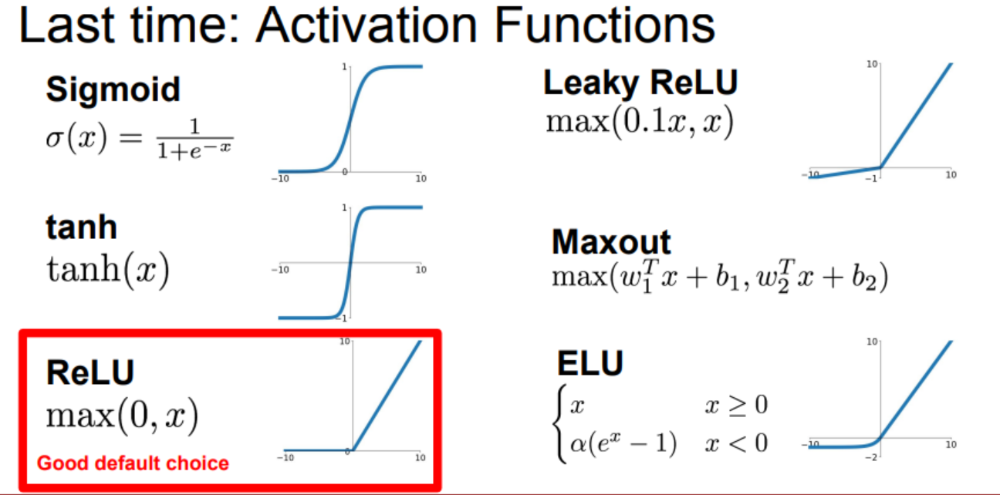


---

## **5. Optimizers: Adam vs. Batch Normalization**
| **Aspect**               | **Batch Normalization**                         | **Adam Optimizer**                             |
|--------------------------|-------------------------------------------------|------------------------------------------------|
| **Definition**           | Learnable parameters (Gamma/Beta) for scaling and shifting activations. | Hyperparameters for optimizing the gradient flow (β₁/β₂). |
| **Purpose**              | Adjusts activations to maintain stability during training. | Adjusts the learning rate dynamically based on the gradients. |
| **Training Behavior**    | Learnable during training.                     | Fixed throughout training.                    |
| **Scope**                | Specific to each layer in the network.         | Affects the entire gradient update process.    |

---

## **6. Neural Network Optimization and Feature Extraction**
- **Neural Networks' Hierarchical Feature Learning:**
  - **Neuron View in Conv Layers:** Each neuron detects specific features in localized regions, like edges or textures in early layers, progressing to more complex patterns in deeper layers.
  - **Feature Extraction:** Convolutional layers extract local patterns, which are progressively combined and abstracted in deeper layers.

---

## **Session Summary**

### **1. Data Centering and Activation Functions**
- **Zero-Centered Data Effects:**
  - **Challenges with ReLU:** Risk of "dead neurons" due to non-negative outputs.
  - **Challenges with Sigmoid:** Vanishing gradients in saturation regions.
- **Solutions:**
  - Use activation-friendly initializations (e.g., He Initialization for ReLU).
  - Alternatives like Leaky ReLU and Batch Normalization.

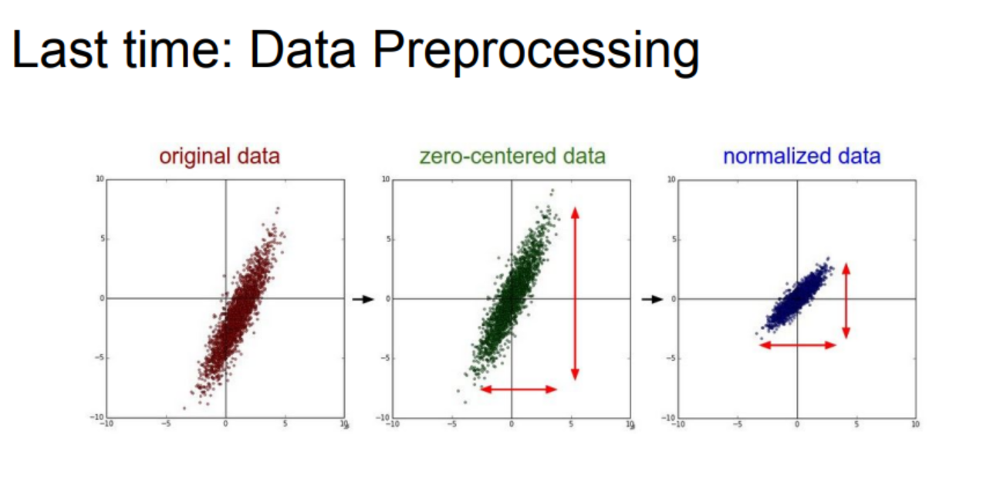

---

### **2. Weight Initialization in CNNs**
- **Purpose:** Ensures stable gradient flow and avoids exploding/vanishing gradients.
- **Common Techniques:**
  - **Xavier Initialization:** 
    - Suitable for tanh/sigmoid but not ideal for ReLU due to its positive-only nature.
  - **He Initialization:** 
    - Tailored for ReLU to maintain stable activations and gradients.
- **Problems with Poor Initialization:**
  - **W=0 Initialization:** Prevents learning due to symmetry.
  - **Very Large Weights:** Causes exploding gradients and instability.

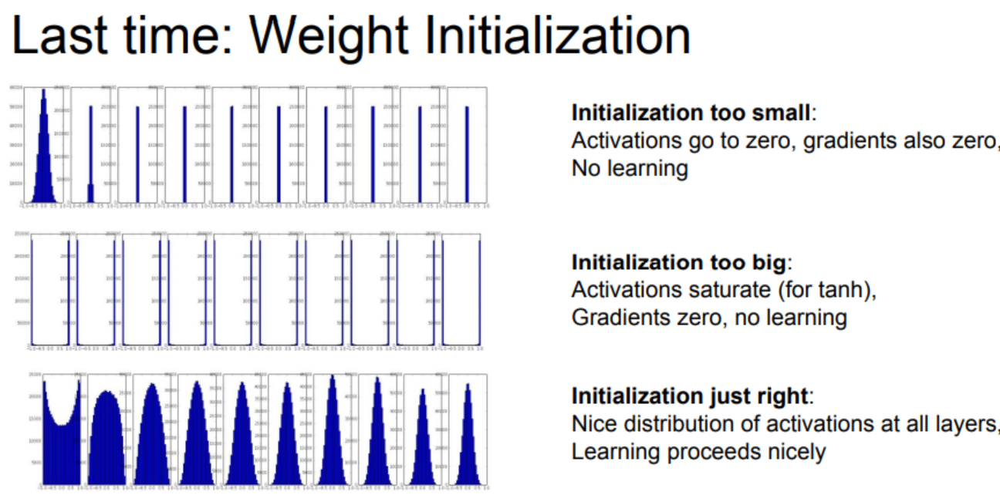

---

### **3. Batch Normalization**
- **Purpose:** Normalizes activations to have a unit Gaussian distribution within a batch.
- **Advantages:**
  - Improves gradient flow.
  - Allows higher learning rates.
  - Acts as regularization, reducing dependency on dropout.
- **Training vs. Testing Behavior:**
  - **During training:** Uses batch-specific mean/variance.
  - **During testing:** Uses running averages computed during training.
- **Key Parameters Gamma (Scale) and Beta (Shift):** Learnable parameters that adjust the normalized output.
  - **Gamma (scale):** Adjusts the activation range.
  - **Beta (shift):** Shifts the activation mean.
- **Benefits:** Reduces sensitivity to weight initialization and regularizes the model, often reducing the need for techniques like dropout.

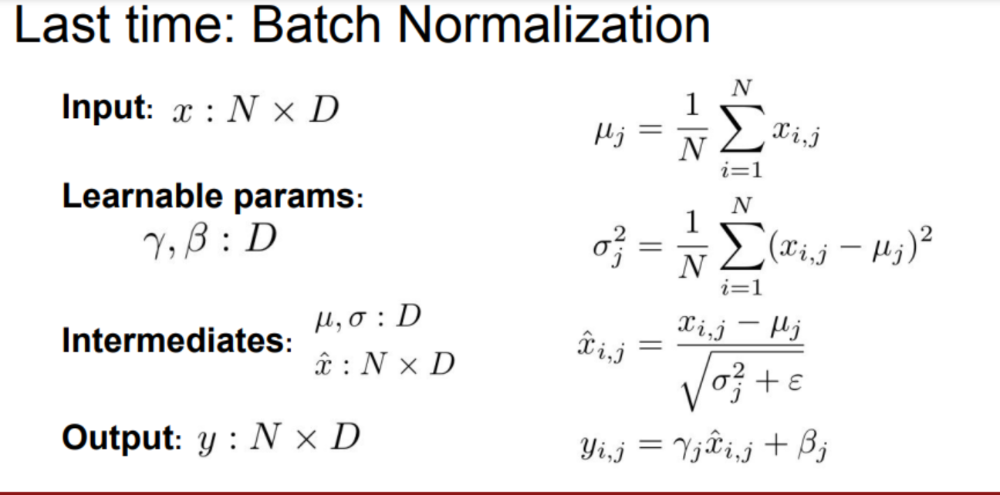

---

### **4. Comparison of Gamma/Beta in Batch Normalization vs. β₁/β₂ in Adam Optimizer**
| **Aspect**               | **Batch Normalization (Gamma/Beta)**                  | **Adam Optimizer (β₁/β₂)**                     |
|--------------------------|-----------------------------------------------------|-----------------------------------------------|
| **Definition**           | Learnable parameters for scaling and shifting activations. | Fixed hyperparameters for decay rates of moving averages. |
| **Purpose**              | Adds flexibility to normalized activations.          | Controls the influence of past gradients in updates.      |
| **Training Behavior**    | Updated during training.                             | Fixed throughout training.                               |
| **Type**                 | Layer-specific, tied to network activations.         | Optimizer-specific, tied to gradient computation.         |

---

### **Focus of the Session**
This session explored:
1. The impact of zero-centered data on activation functions and training stability.
2. The importance of weight initialization techniques, emphasizing He Initialization for ReLU.
3. The role of Batch Normalization in stabilizing training and improving performance.
4. The differences between Batch Norm parameters (Gamma/Beta) and Adam Optimizer hyperparameters (β₁/β₂).
